In [1]:
import os
import glob
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
COLUMN_NAMES = [
    'acc_chest_x', 'acc_chest_y', 'acc_chest_z',    # 0-2 (Chest Acc)
    'ecg_1', 'ecg_2',                               # 3-4 (ECG)
    'acc_ankle_x', 'acc_ankle_y', 'acc_ankle_z',    # 5-7 (Ankle Acc)
    'gyro_ankle_x', 'gyro_ankle_y', 'gyro_ankle_z', # 8-10 (Ankle Gyro)
    'mag_ankle_x', 'mag_ankle_y', 'mag_ankle_z',    # 11-13 (Ankle Mag)
    'acc_arm_x', 'acc_arm_y', 'acc_arm_z',          # 14-16 (Arm Acc)
    'gyro_arm_x', 'gyro_arm_y', 'gyro_arm_z',       # 17-19 (Arm Gyro)
    'mag_arm_x', 'mag_arm_y', 'mag_arm_z',          # 20-22 (Arm Mag)
    'activity_id'                                   # 23 (Label)
]

target_activities = {
    4: 'Walking',                   # 비교군 1 (동작의 구분감)
    6: 'Waist bends forward',       # 후보 1
    7: 'Frontal elevation of arms', # 후보 2
    8: 'Knees bending',             # 후보 3
    9: 'Cycling',                   # 비교군 2 (동작 속도의 적합성)
    12: 'Jump front & back'         # 비교군 3 (단축 동작)
}

def load_mhealth_dataset(data_dir='./'):
    full_dataset = {}

    file_list = sorted(glob.glob(os.path.join(data_dir, "mHealth_subject*.log")))

    if not file_list:
        print(f"Error: No files found in directory '{data_dir}'. Check the path and file names.")
        return {}

    for file_path in file_list:
        file_name = os.path.basename(file_path)
        subj_id = file_name.split('.')[0].replace('_', '')

        df = pd.read_csv(file_path, sep="\t", header=None)
        if df.shape[1] == len(COLUMN_NAMES):
            df.columns = COLUMN_NAMES
        else:
            print(f"Warning: {subj_id} has {df.shape[1]} columns, expected {len(COLUMN_NAMES)}.")

        subj_data = {}

        for label_code, activity_name in target_activities.items():
            activity_df = df[df['activity_id'] == label_code].copy()

            if not activity_df.empty:
                subj_data[activity_name] = activity_df.drop(columns=['activity_id'])

        full_dataset[subj_id] = subj_data

    print(f"\nSuccessfully loaded data for {len(full_dataset)} subjects.")
    return full_dataset

data_directory = '/content/drive/MyDrive/Colab Notebooks/HAR_data/MHEALTHDATASET'
mhealth_data = load_mhealth_dataset(data_directory)


Successfully loaded data for 10 subjects.


In [3]:
mhealth_data.keys()

dict_keys(['mHealthsubject1', 'mHealthsubject10', 'mHealthsubject2', 'mHealthsubject3', 'mHealthsubject4', 'mHealthsubject5', 'mHealthsubject6', 'mHealthsubject7', 'mHealthsubject8', 'mHealthsubject9'])

In [6]:
def plot_activity_detail(data_dict, subject_id, activity_name, duration_sec=10):
    """
    특정 활동의 주요 센서(Acc, Gyro) 데이터를 시계열로 시각화합니다.
    Mag, ECG는 움직임 복잡성 분석에서 후순위이므로 제외했습니다.
    """
    if subject_id not in data_dict or activity_name not in data_dict[subject_id]:
        print(f"Data not found: {subject_id} - {activity_name}")
        return

    df = data_dict[subject_id][activity_name]

    # 50Hz 샘플링이므로 duration_sec * 50 만큼 자릅니다.
    samples = duration_sec * 50
    df_subset = df.iloc[:samples].copy()
    time_axis = np.arange(len(df_subset)) / 50.0  # 시간축 생성 (초)

    # 시각화할 센서 그룹 정의
    sensor_groups = {
        'Chest Accel': ['acc_chest_x', 'acc_chest_y', 'acc_chest_z'],
        'Ankle Accel': ['acc_ankle_x', 'acc_ankle_y', 'acc_ankle_z'],
        'Ankle Gyro':  ['gyro_ankle_x', 'gyro_ankle_y', 'gyro_ankle_z'],
        'Arm Accel':   ['acc_arm_x', 'acc_arm_y', 'acc_arm_z'],
        'Arm Gyro':    ['gyro_arm_x', 'gyro_arm_y', 'gyro_arm_z']
    }

    fig, axes = plt.subplots(len(sensor_groups), 1, figsize=(15, 12), sharex=True)
    fig.suptitle(f"{activity_name} ({subject_id})", fontsize=16, fontweight='bold')

    for i, (group_name, cols) in enumerate(sensor_groups.items()):
        ax = axes[i]
        for col in cols:
            # X, Y, Z 축 그리기
            ax.plot(time_axis, df_subset[col], label=col.split('_')[-1].upper(), alpha=0.8)

        ax.set_title(group_name, fontsize=12, loc='left', fontweight='bold')
        ax.set_ylabel("Value")
        ax.legend(loc='upper right', fontsize=8)
        ax.grid(True, linestyle='--', alpha=0.5)

    axes[-1].set_xlabel("Time (seconds)")
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

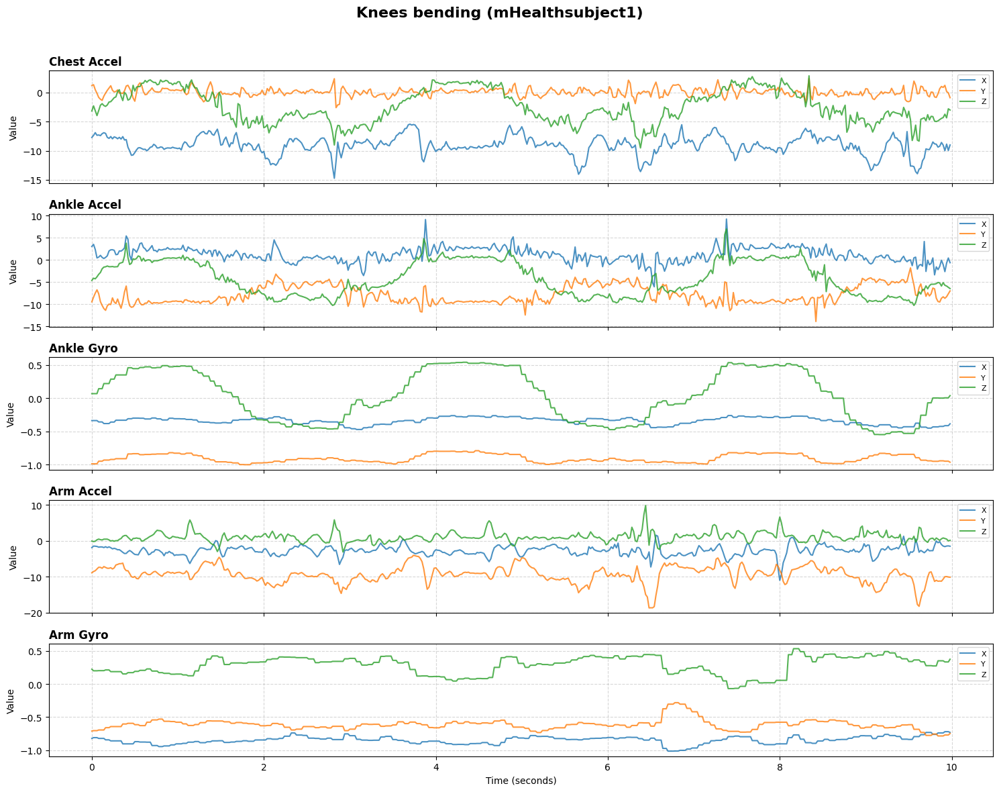

In [9]:
plot_activity_detail(mhealth_data, 'mHealthsubject1', 'Knees bending')

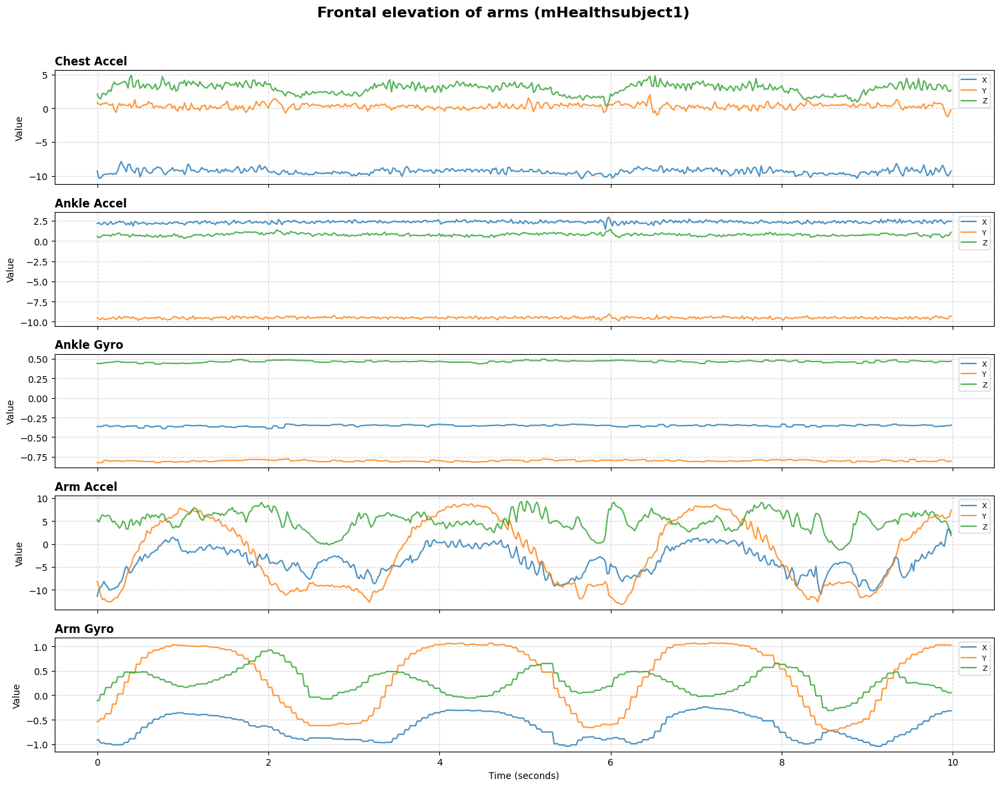

In [10]:
plot_activity_detail(mhealth_data, 'mHealthsubject1', 'Frontal elevation of arms')

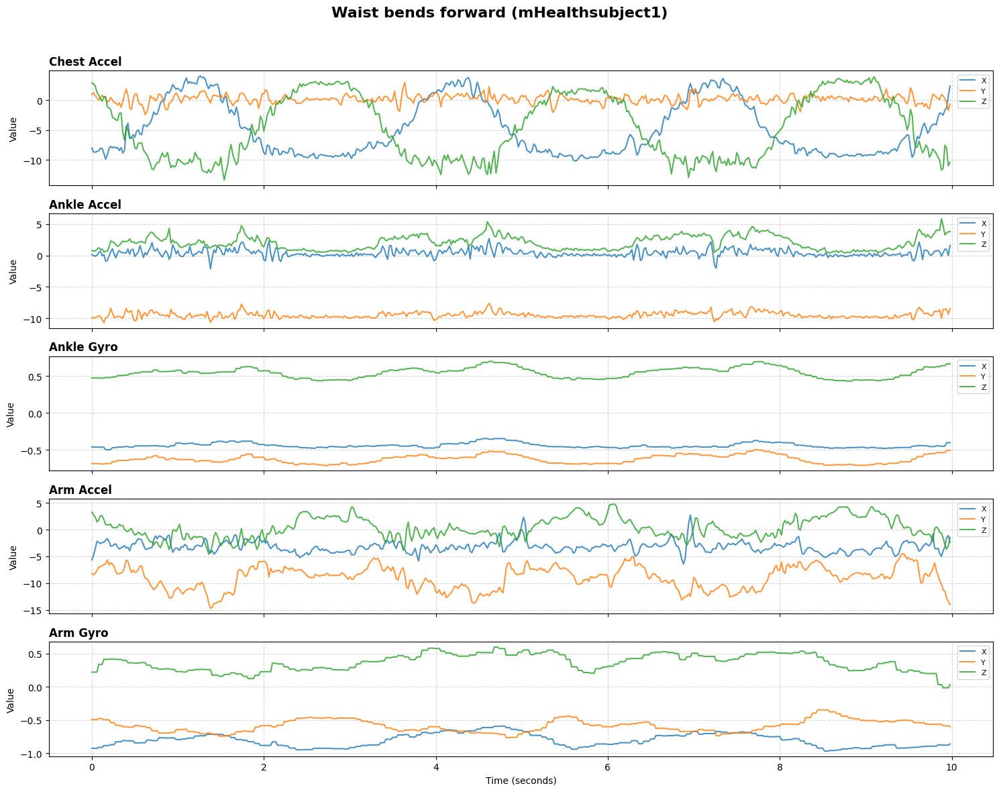

In [11]:
plot_activity_detail(mhealth_data, 'mHealthsubject1', 'Waist bends forward')

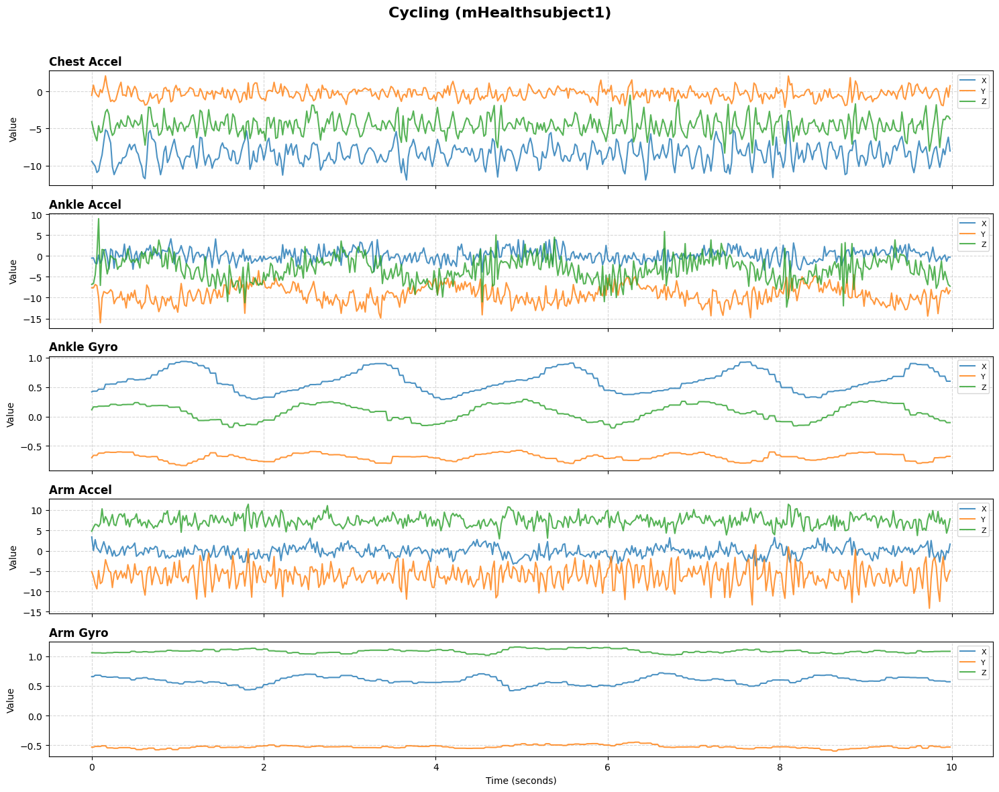

In [12]:
plot_activity_detail(mhealth_data, 'mHealthsubject1', 'Cycling')

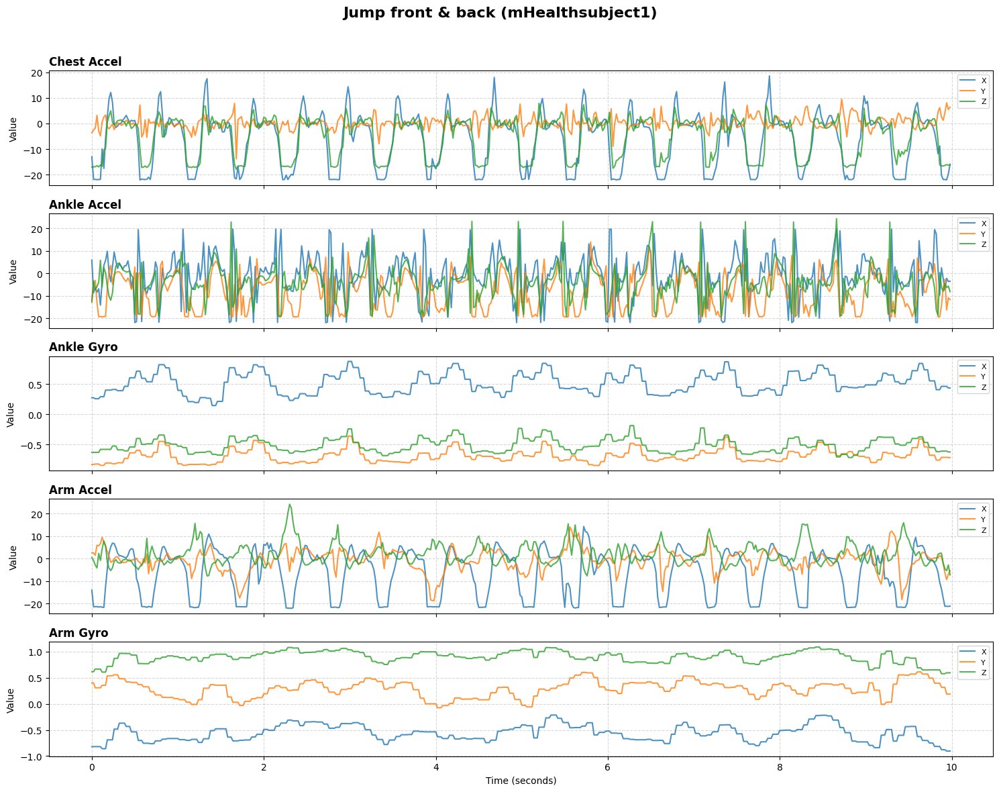

In [13]:
plot_activity_detail(mhealth_data, 'mHealthsubject1', 'Jump front & back')

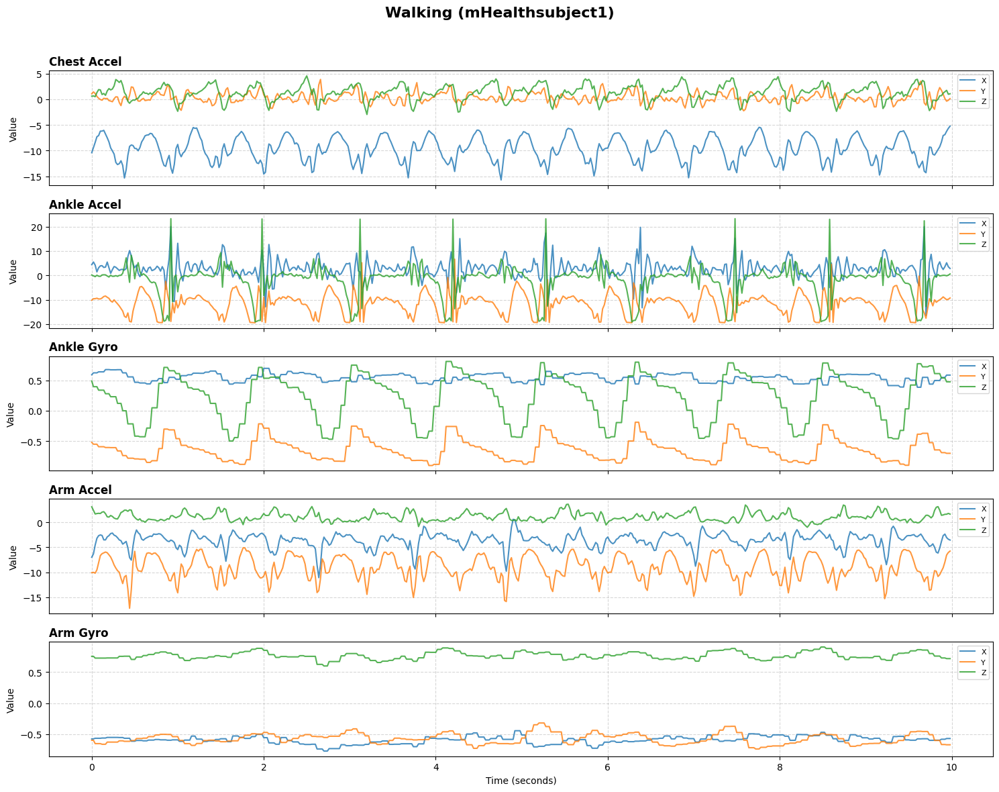

In [14]:
plot_activity_detail(mhealth_data, 'mHealthsubject1', 'Walking')

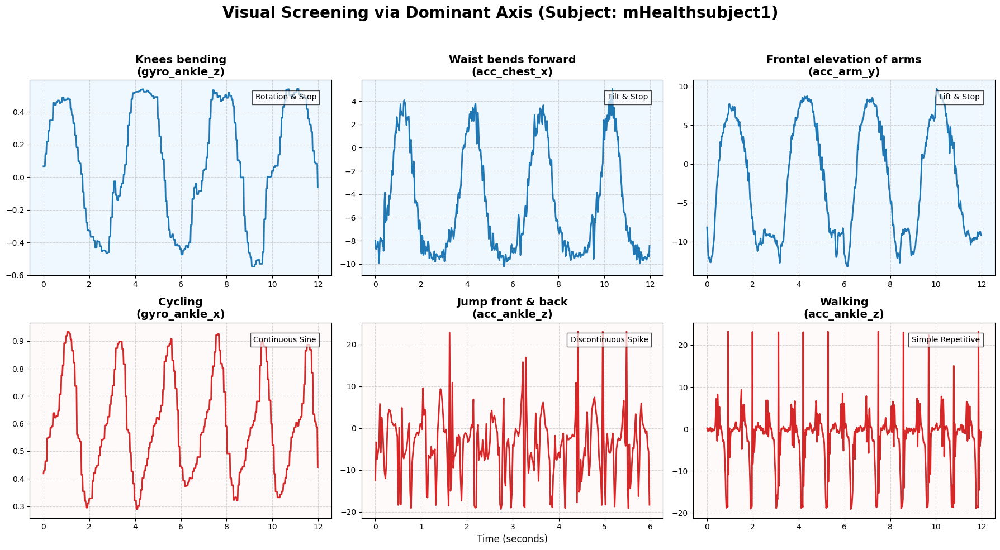

In [22]:
def plot_screening_grid(data_dict, subject_id):
    """
    가설 검증을 위해 선정된 6개 활동의 Dominant Axis를 2x3 그리드로 시각화합니다.
    - Row 1: Target Candidates (연구 대상)
    - Row 2: Comparison Groups (대조군/제외 대상)
    """

    # 설정: 활동명, 센서축, 그래프 색상, y축 라벨
    # Row 1: Candidates (Manifold 분석 적합)
    targets = [
        {'act': 'Knees bending',             'axis': 'gyro_ankle_z', 'color': 'tab:blue',   'desc': 'Rotation & Stop', 'duration': 600},
        {'act': 'Waist bends forward',       'axis': 'acc_chest_x',  'color': 'tab:blue',   'desc': 'Tilt & Stop', 'duration': 600},
        {'act': 'Frontal elevation of arms', 'axis': 'acc_arm_y',    'color': 'tab:blue',   'desc': 'Lift & Stop', 'duration': 600}
    ]

    # Row 2: Comparisons (단순/연속 동작)
    comparisons = [
        {'act': 'Cycling',           'axis': 'gyro_ankle_x', 'color': 'tab:red', 'desc': 'Continuous Sine', 'duration': 600},
        {'act': 'Jump front & back', 'axis': 'acc_ankle_z',  'color': 'tab:red',  'desc': 'Discontinuous Spike', 'duration': 300},
        {'act': 'Walking',           'axis': 'acc_ankle_z',  'color': 'tab:red',  'desc': 'Simple Repetitive', 'duration': 600}
    ]

    # 전체 리스트 합치기
    plot_items = targets + comparisons

    fig, axes = plt.subplots(2, 3, figsize=(18, 10), sharex=False)
    fig.suptitle(f"Visual Screening via Dominant Axis (Subject: {subject_id})", fontsize=20, weight='bold')

    axes = axes.flatten() # 2x3 배열을 1차원으로 펼침

    for i, item in enumerate(plot_items):
        ax = axes[i]
        act_name = item['act']
        axis_name = item['axis']
        duration = item.get('duration', 300)

        if act_name in data_dict[subject_id]:
            # 6초 (300 샘플) 데이터만 추출하여 패턴 확인
            df = data_dict[subject_id][act_name].iloc[:duration]
            time = np.arange(len(df)) / 50.0

            # 그래프 그리기
            ax.plot(time, df[axis_name], color=item['color'], linewidth=2)

            # 스타일링
            ax.set_title(f"{act_name}\n({axis_name})", fontsize=14, weight='bold')
            ax.grid(True, linestyle='--', alpha=0.5)

            # 설명 텍스트 (우측 상단)
            ax.text(0.95, 0.9, item['desc'], transform=ax.transAxes,
                    ha='right', fontsize=10, bbox=dict(facecolor='white', alpha=0.7))

            # 가설 검증 포인트 하이라이트 (Target 그룹만)
            if i < 3:
                ax.set_facecolor('#f0f8ff') # 살짝 푸른 배경 (Target임을 강조)
            else:
                ax.set_facecolor('#fffafa') # 살짝 붉은 배경 (Comparison임을 강조)

        else:
            ax.text(0.5, 0.5, "Data Not Found", ha='center')

    axes[-2].set_xlabel("Time (seconds)", fontsize=12)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# --- 실행 ---
first_subj = list(mhealth_data.keys())[0]
plot_screening_grid(mhealth_data, first_subj)

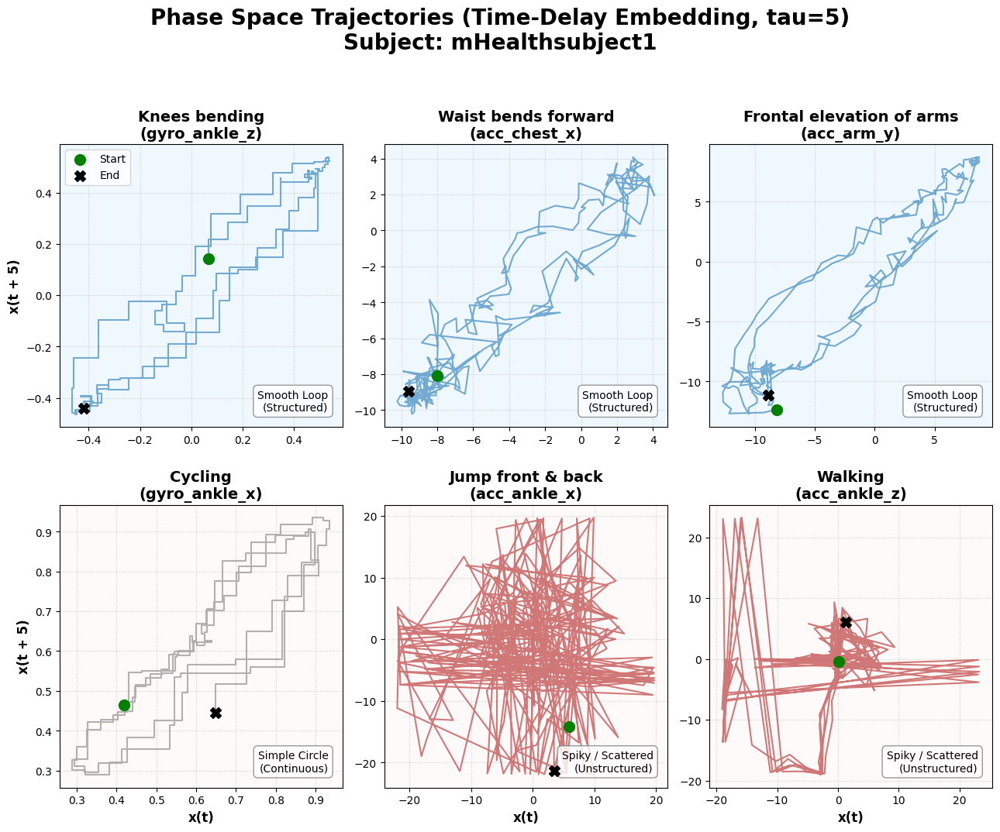

In [24]:
import matplotlib.pyplot as plt
import numpy as np

def plot_phase_space_grid(data_dict, subject_id, delay=5):
    """
    Time-Delay Embedding을 사용하여 6개 활동의 위상 공간 궤적을 그립니다.
    X축: x(t), Y축: x(t + delay)
    """

    # 분석할 활동 및 대표 축 정의 (이전 단계와 동일)
    # desc는 예상되는 궤적의 형태를 기술함
    targets = [
        {'act': 'Knees bending',             'axis': 'gyro_ankle_z', 'color': 'tab:blue',   'desc': 'Smooth Loop\n(Structured)'},
        {'act': 'Waist bends forward',       'axis': 'acc_chest_x',  'color': 'tab:blue',   'desc': 'Smooth Loop\n(Structured)'},
        {'act': 'Frontal elevation of arms', 'axis': 'acc_arm_y',    'color': 'tab:blue',   'desc': 'Smooth Loop\n(Structured)'}
    ]

    comparisons = [
        {'act': 'Cycling',           'axis': 'gyro_ankle_x', 'color': 'gray',       'desc': 'Simple Circle\n(Continuous)'},
        {'act': 'Jump front & back', 'axis': 'acc_ankle_x',  'color': 'firebrick',  'desc': 'Spiky / Scattered\n(Unstructured)'},
        {'act': 'Walking',           'axis': 'acc_ankle_z',  'color': 'firebrick',  'desc': 'Spiky / Scattered\n(Unstructured)'}
    ]

    plot_items = targets + comparisons
    duration = 300 # 6초 분량 (약 2~3주기)

    fig, axes = plt.subplots(2, 3, figsize=(13, 11))
    fig.suptitle(f"Phase Space Trajectories (Time-Delay Embedding, tau={delay})\nSubject: {subject_id}", fontsize=20, weight='bold')

    axes = axes.flatten()

    for i, item in enumerate(plot_items):
        ax = axes[i]
        act_name = item['act']
        axis_name = item['axis']

        if act_name in data_dict[subject_id]:
            # 데이터 추출 (6초)
            data = data_dict[subject_id][act_name][axis_name].values[:duration]

            # Time-Delay Embedding 데이터 생성
            # x(t): 처음부터 끝-delay까지
            # x(t+tau): delay부터 끝까지
            x_t = data[:-delay]
            x_t_tau = data[delay:]

            # 궤적 그리기
            # alpha를 낮춰서 궤적이 겹치는 부분을 진하게 표시
            ax.plot(x_t, x_t_tau, color=item['color'], linewidth=1.5, alpha=0.6)

            # 시작점(초록색 동그라미)과 끝점(검은색 X) 표시 -> 궤적의 흐름 파악용
            ax.scatter(x_t[0], x_t_tau[0], color='green', s=100, label='Start', zorder=5)
            ax.scatter(x_t[-1], x_t_tau[-1], color='black', marker='X', s=100, label='End', zorder=5)

            # 스타일링
            ax.set_title(f"{act_name}\n({axis_name})", fontsize=14, weight='bold')
            ax.grid(True, linestyle=':', alpha=0.6)
            ax.set_aspect('equal', 'box') # 중요: 비율을 1:1로 맞춰야 찌그러짐 없이 형상을 볼 수 있음

            # 축 라벨 (첫 열과 마지막 행에만 표시)
            if i % 3 == 0: ax.set_ylabel(f"x(t + {delay})", fontsize=12, weight='bold')
            if i >= 3: ax.set_xlabel("x(t)", fontsize=12, weight='bold')

            # 주석 박스
            bbox_props = dict(boxstyle="round,pad=0.4", fc="white", ec="gray", alpha=0.8)
            ax.text(0.95, 0.05, item['desc'], transform=ax.transAxes, ha='right', va='bottom', bbox=bbox_props)

            # 배경색 강조
            if i < 3: ax.set_facecolor('#f0f8ff') # Target (Blue tint)
            else: ax.set_facecolor('#fffafa') # Comparison (Red tint)

        else:
            ax.text(0.5, 0.5, "Data Not Found", ha='center')

    # 범례는 하나만 표시
    axes[0].legend(loc='upper left')

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# --- 실행 ---
first_subj = list(mhealth_data.keys())[0]
plot_phase_space_grid(mhealth_data, first_subj, delay=5)

## 모든 피험자 동일 과정으로 확인

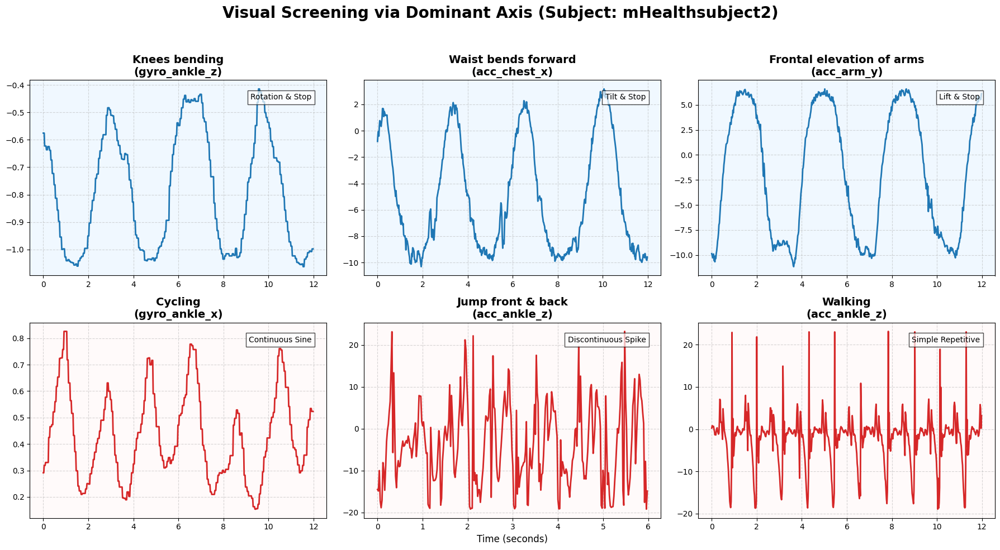

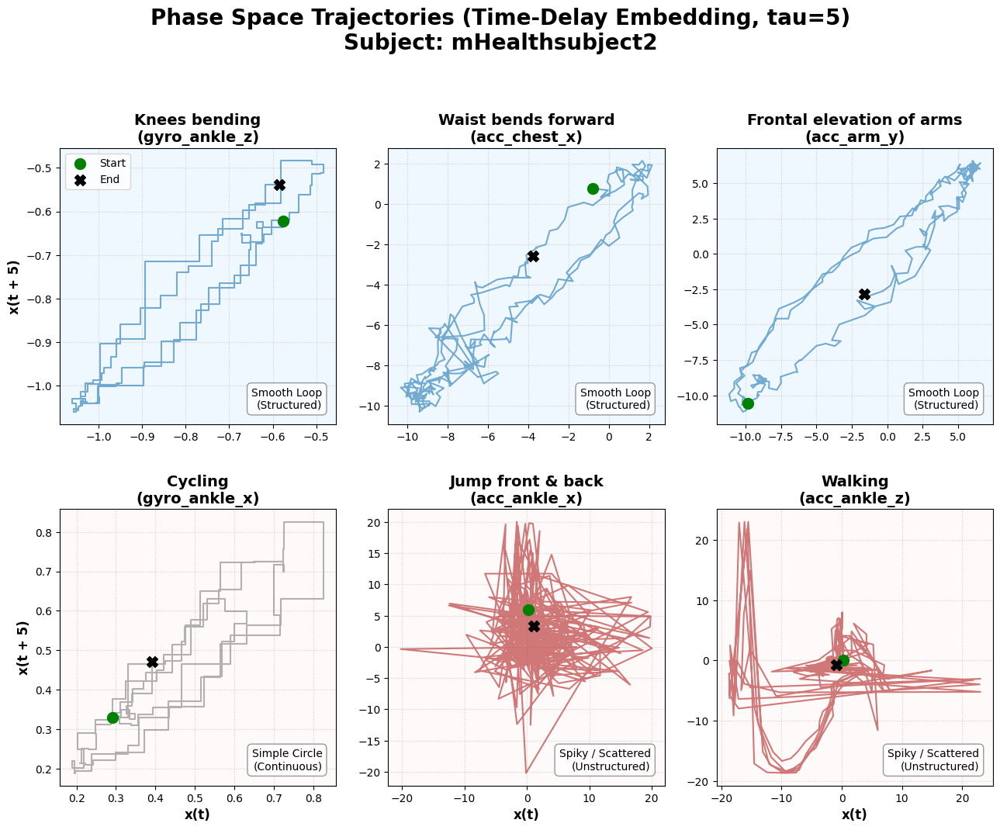

In [26]:
plot_screening_grid(mhealth_data, 'mHealthsubject2')
plot_phase_space_grid(mhealth_data, 'mHealthsubject2', delay=5)

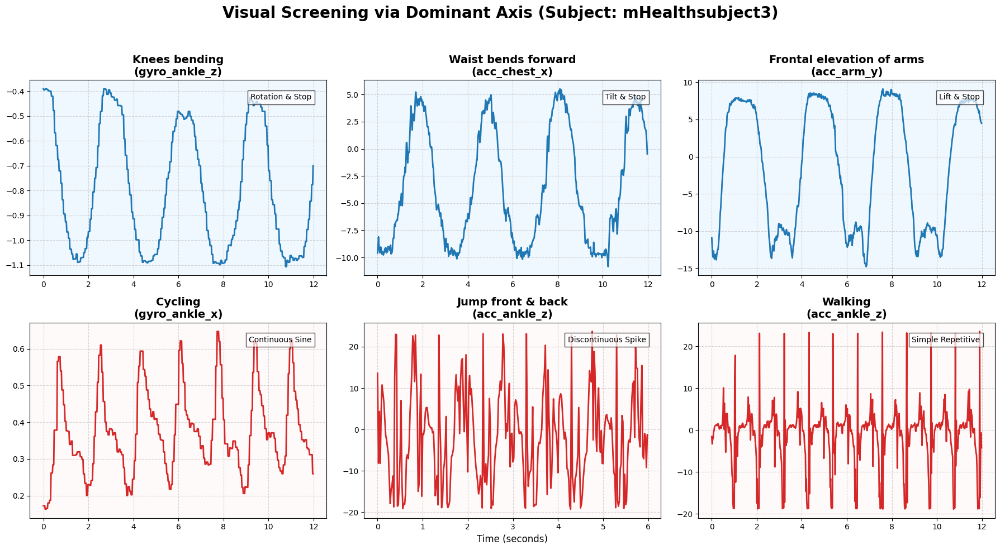

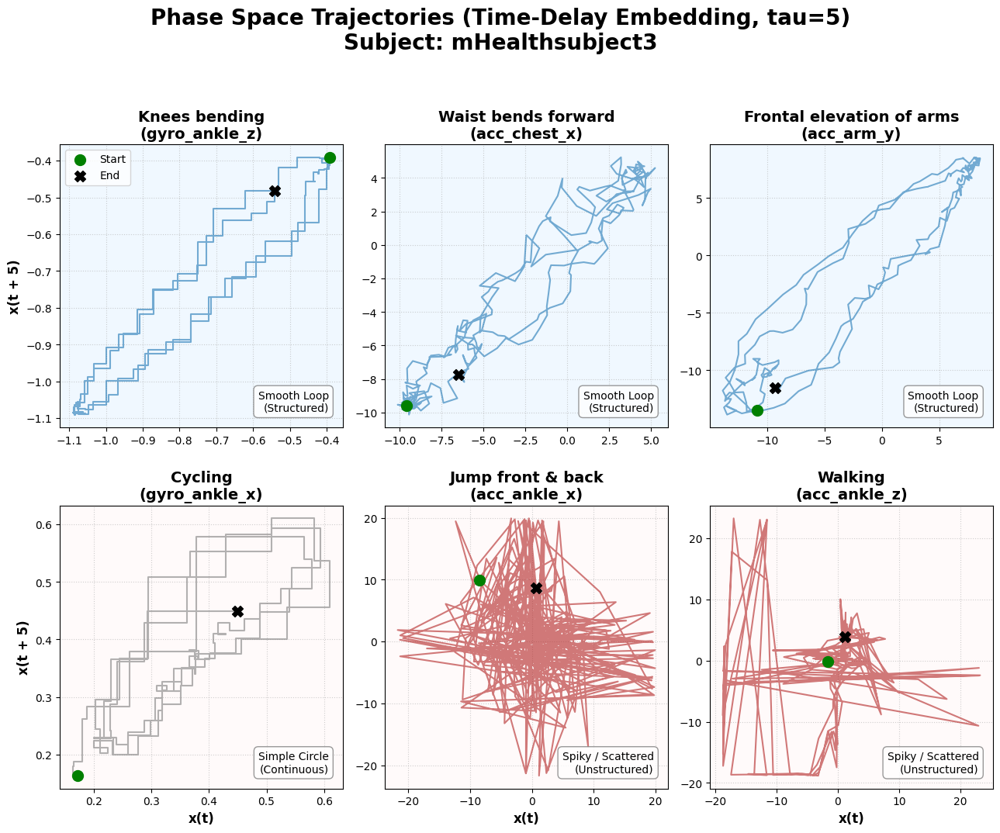

In [28]:
plot_screening_grid(mhealth_data, 'mHealthsubject3')
plot_phase_space_grid(mhealth_data, 'mHealthsubject3', delay=5)

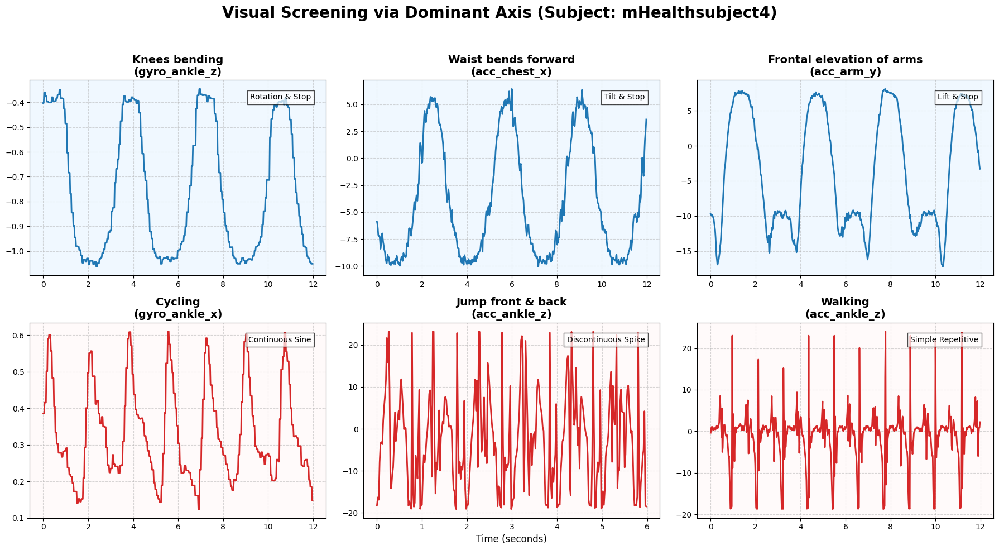

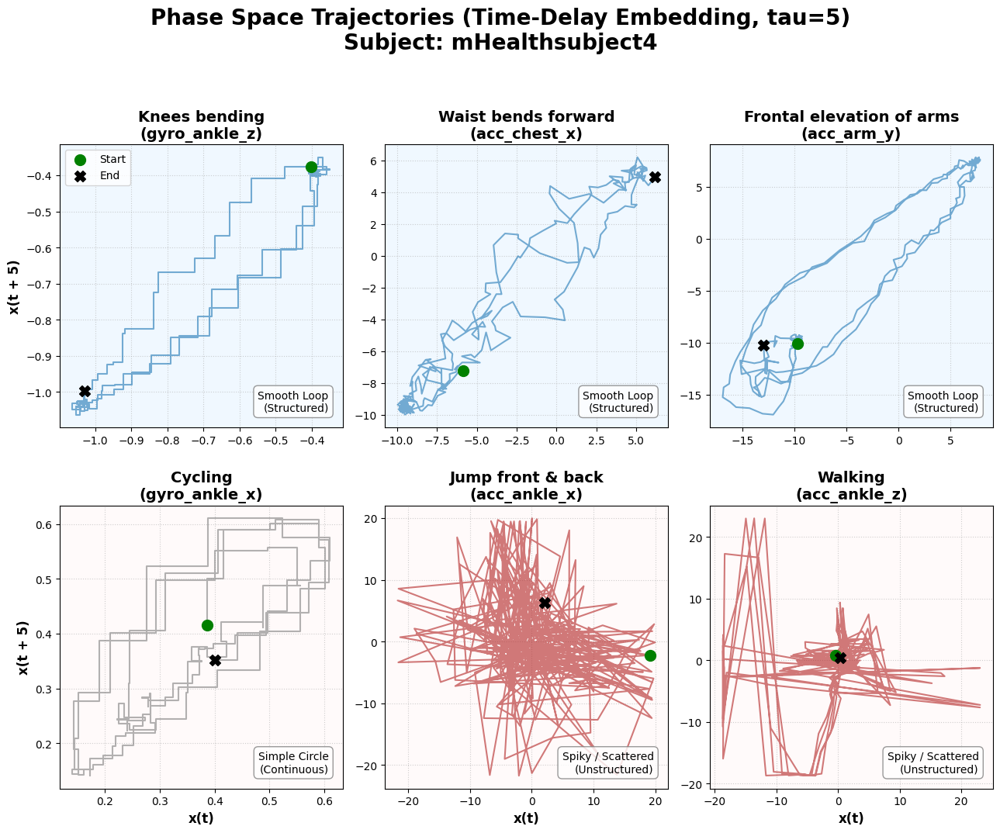

In [29]:
plot_screening_grid(mhealth_data, 'mHealthsubject4')
plot_phase_space_grid(mhealth_data, 'mHealthsubject4', delay=5)

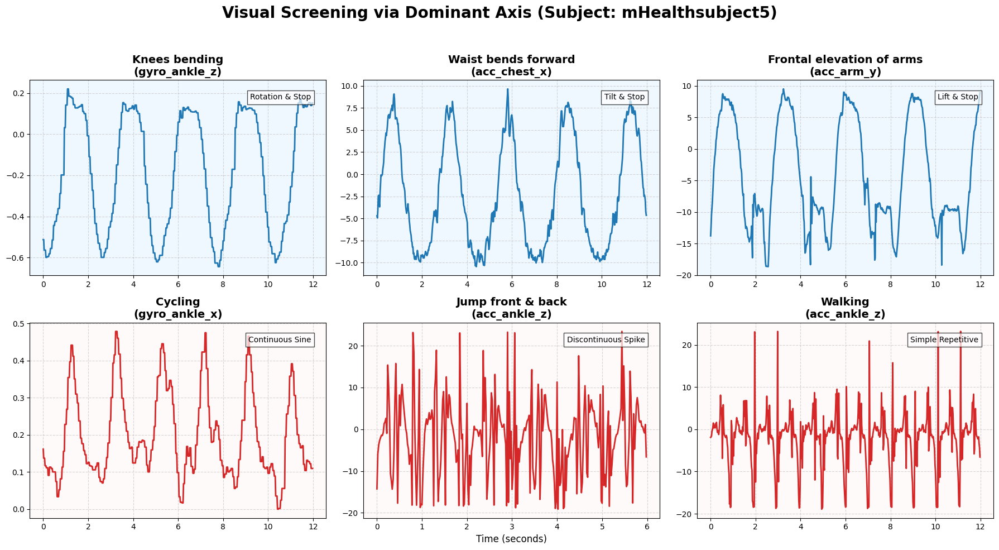

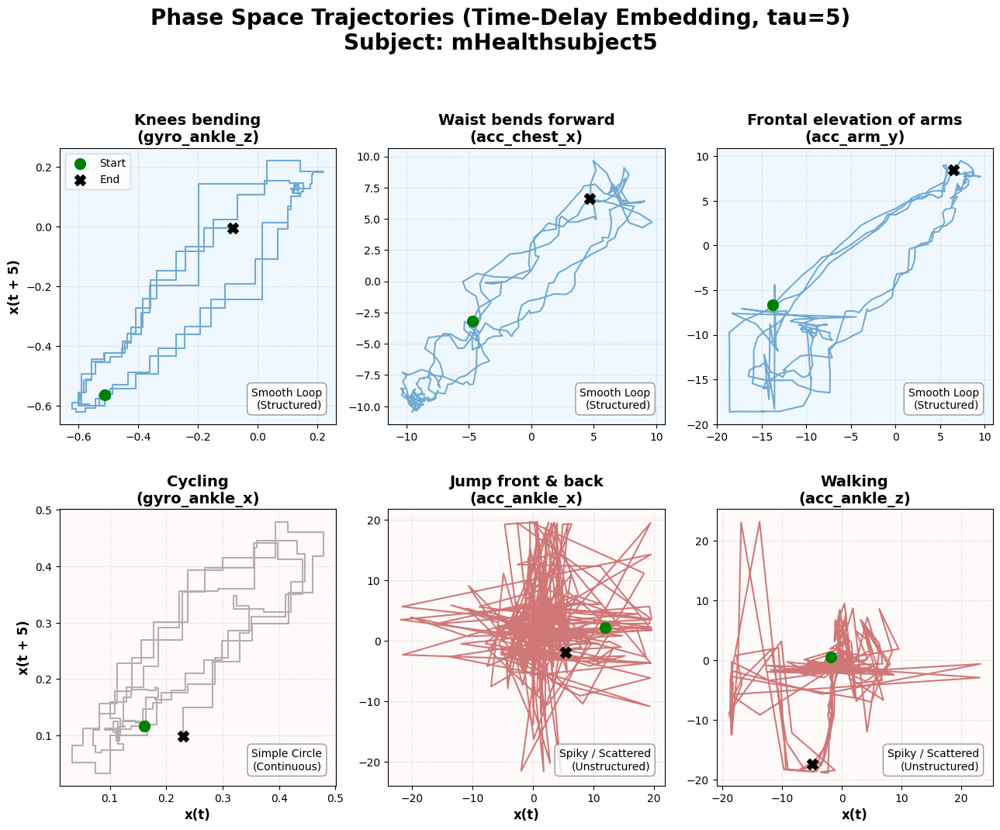

In [30]:
plot_screening_grid(mhealth_data, 'mHealthsubject5')
plot_phase_space_grid(mhealth_data, 'mHealthsubject5', delay=5)

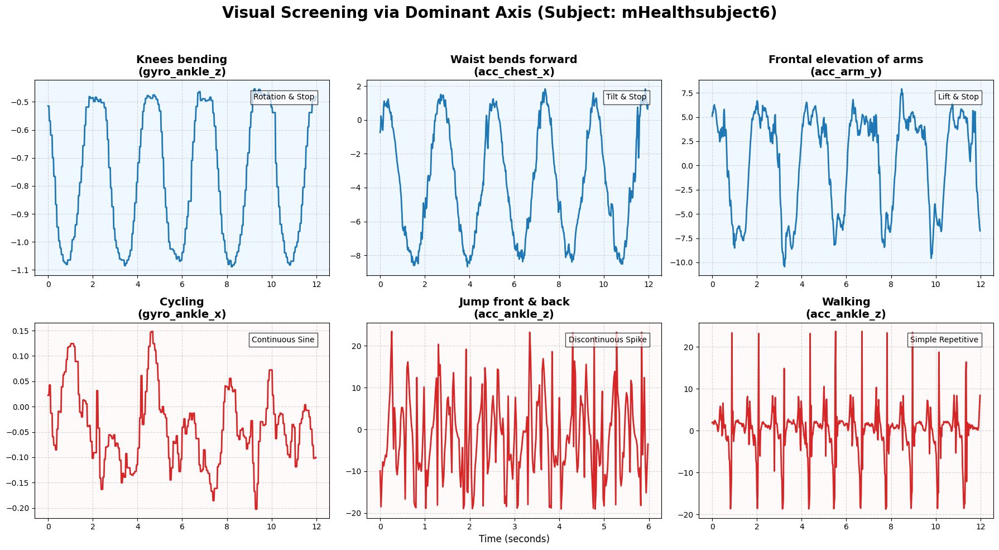

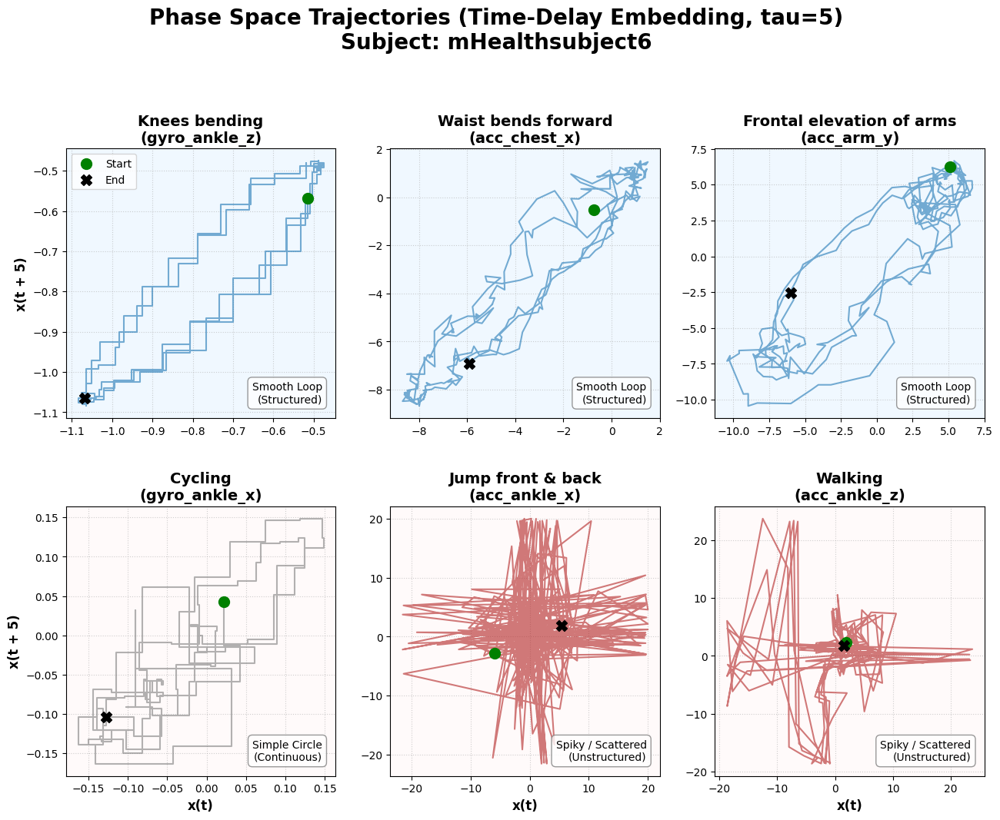

In [31]:
plot_screening_grid(mhealth_data, 'mHealthsubject6')
plot_phase_space_grid(mhealth_data, 'mHealthsubject6', delay=5)

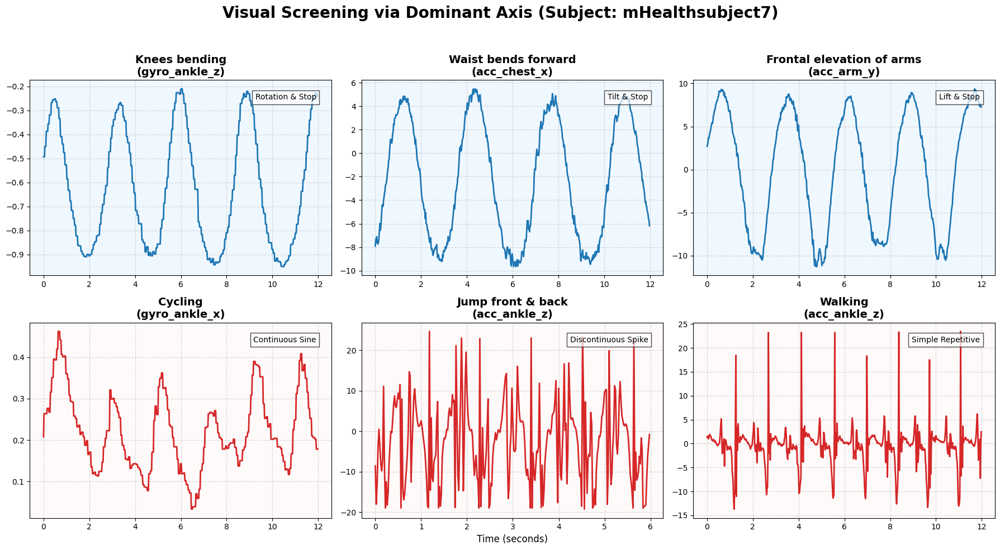

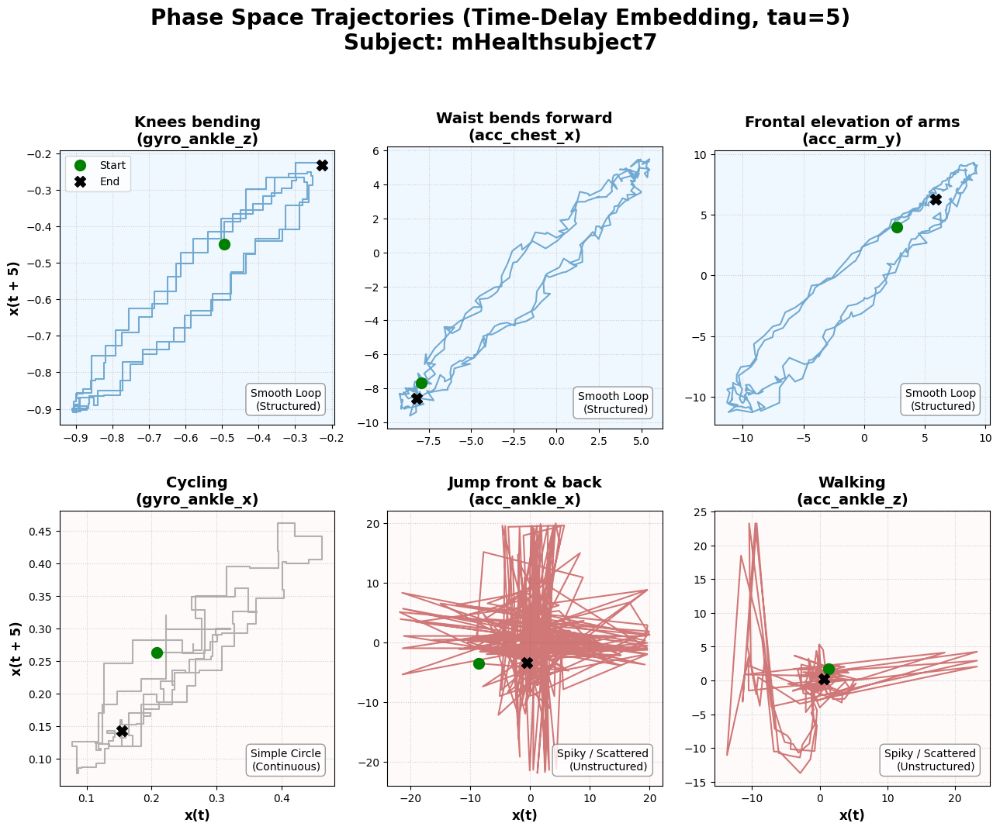

In [32]:
plot_screening_grid(mhealth_data, 'mHealthsubject7')
plot_phase_space_grid(mhealth_data, 'mHealthsubject7', delay=5)

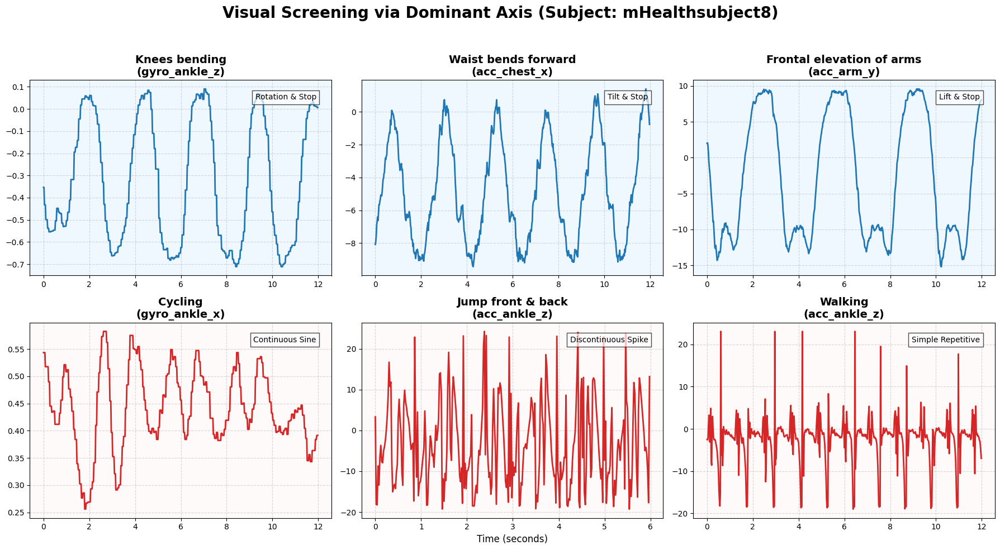

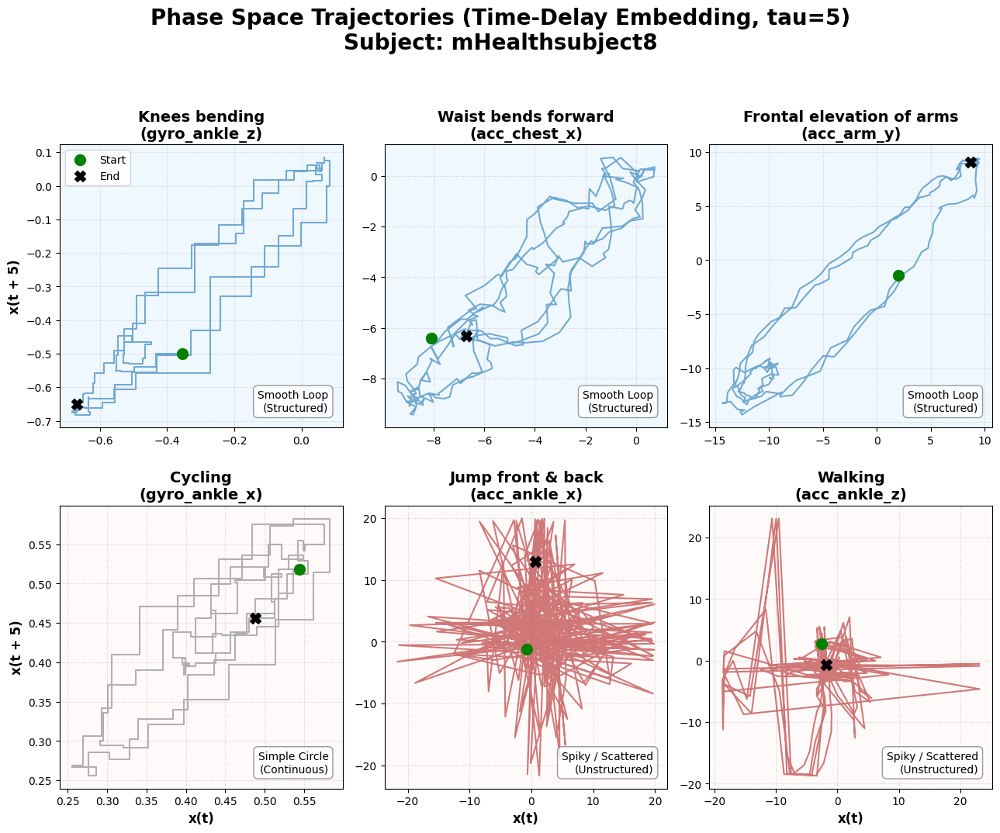

In [33]:
plot_screening_grid(mhealth_data, 'mHealthsubject8')
plot_phase_space_grid(mhealth_data, 'mHealthsubject8', delay=5)

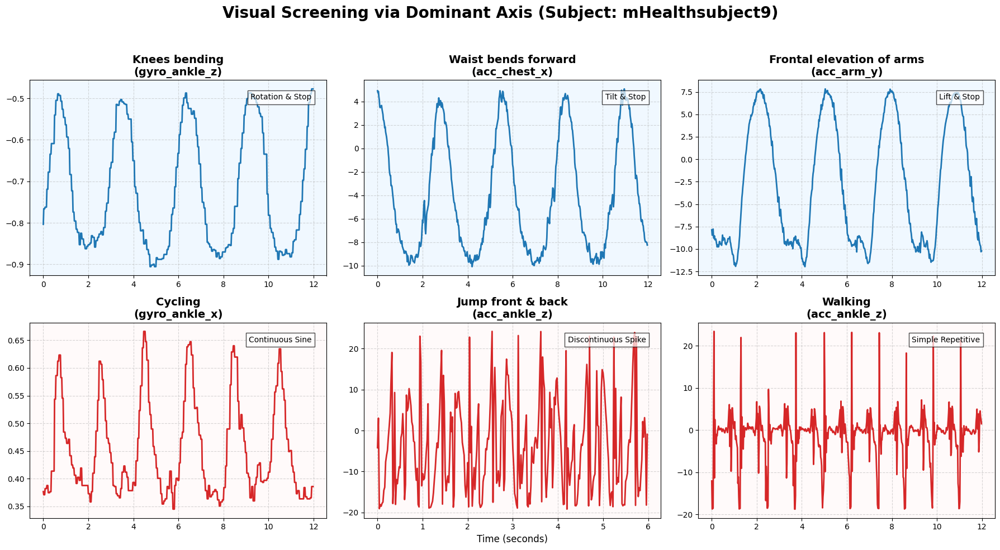

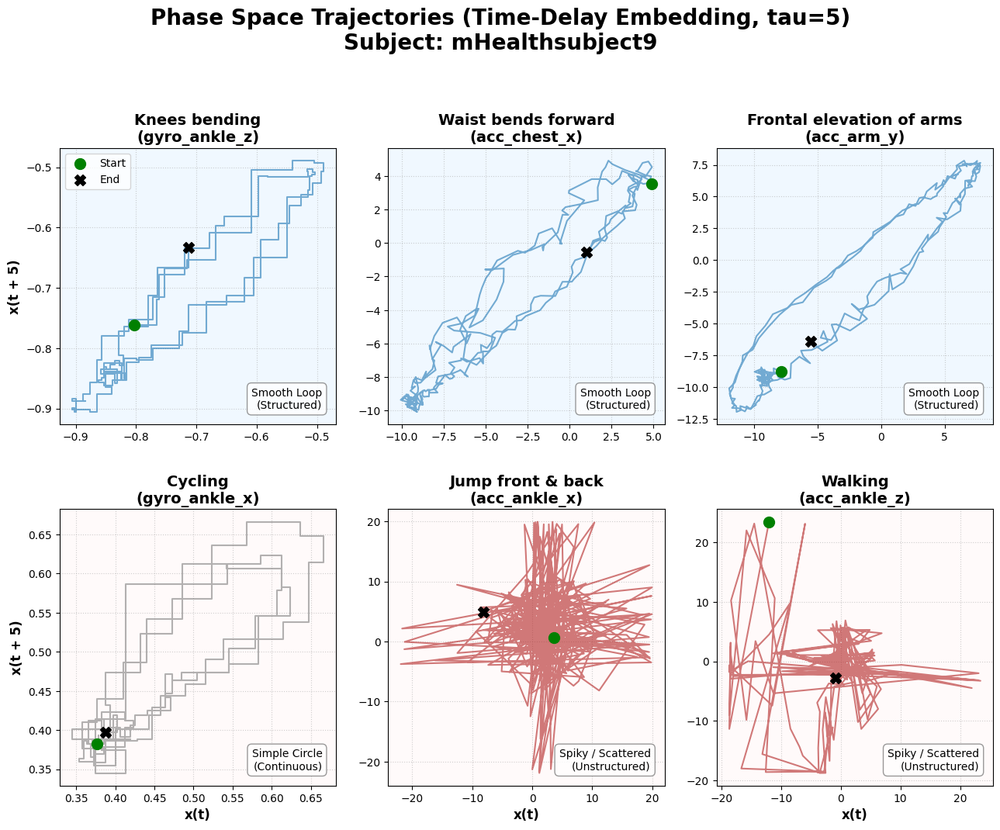

In [34]:
plot_screening_grid(mhealth_data, 'mHealthsubject9')
plot_phase_space_grid(mhealth_data, 'mHealthsubject9', delay=5)

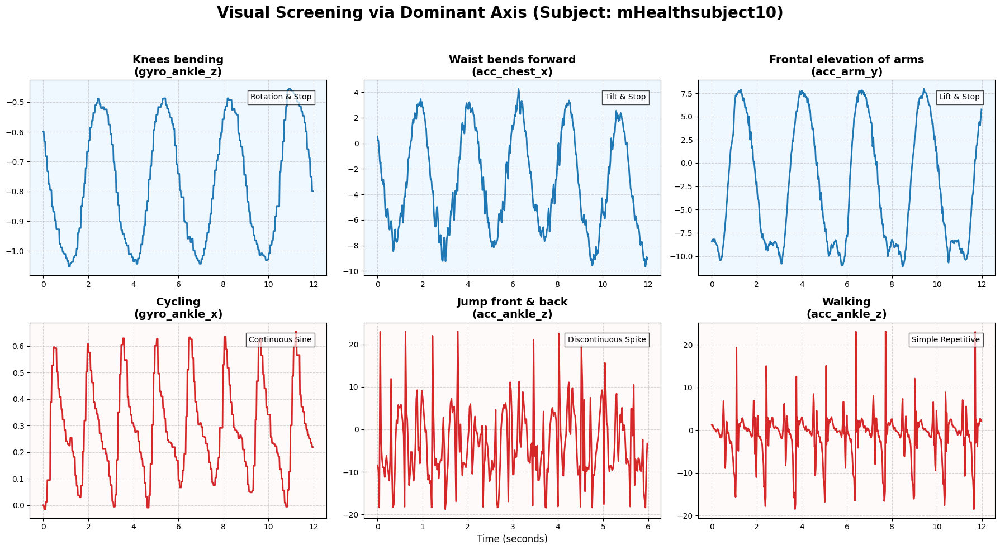

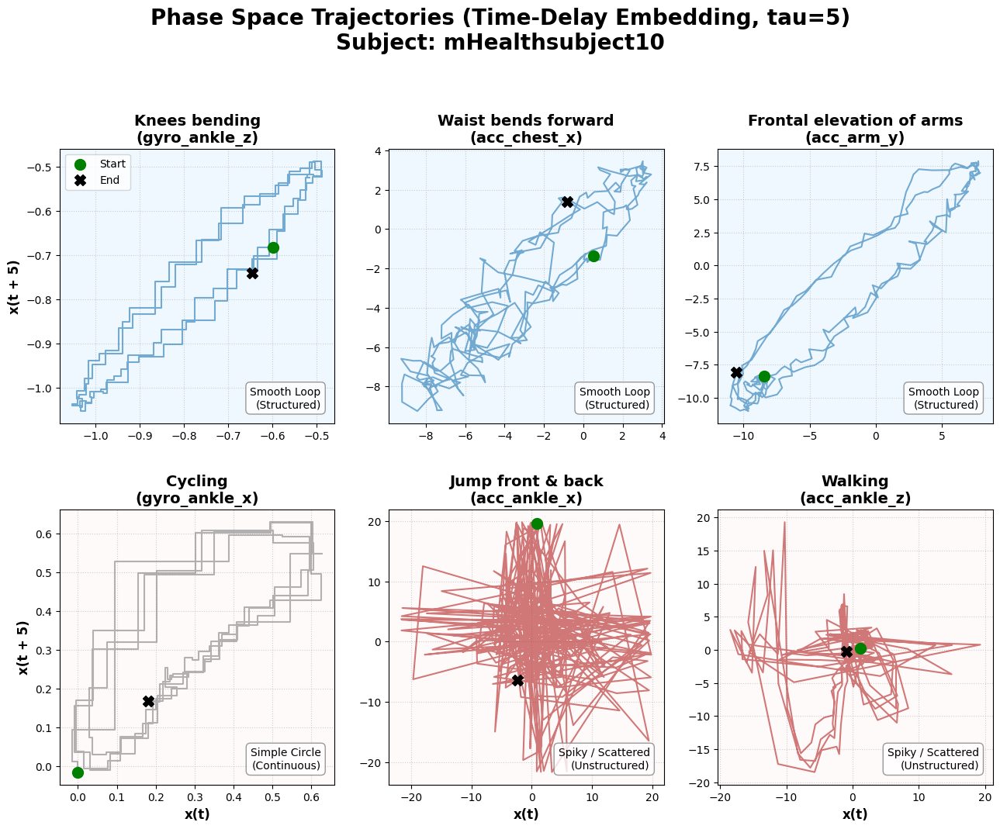

In [35]:
plot_screening_grid(mhealth_data, 'mHealthsubject10')
plot_phase_space_grid(mhealth_data, 'mHealthsubject10', delay=5)

## 정량적 검증

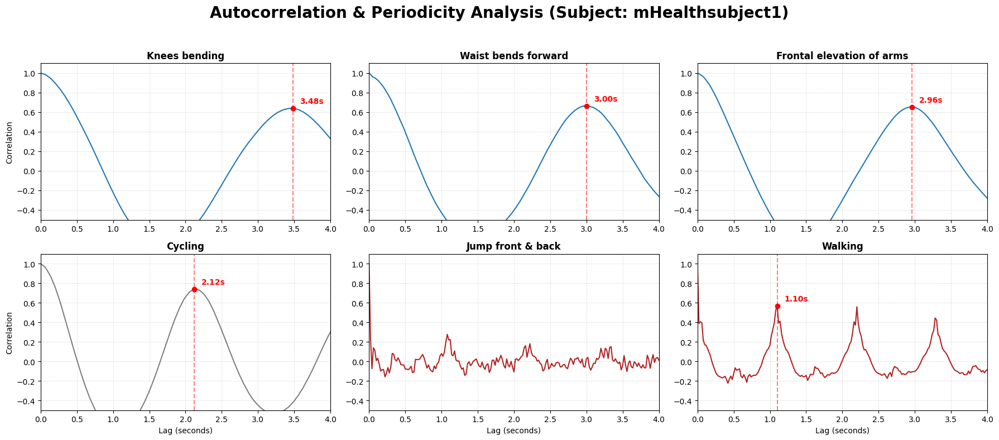


--- [Quantitative Results] Periodicity of mHealthsubject1 ---
Activity                       | Period (s)   | Strength (0-1) 
-----------------------------------------------------------------
Knees bending                  | 3.48         | 0.64           
Waist bends forward            | 3.00         | 0.66           
Frontal elevation of arms      | 2.96         | 0.65           
Cycling                        | 2.12         | 0.74           
Jump front & back              | N/A          | Low            
Walking                        | 1.10         | 0.57           


In [37]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import correlate, find_peaks

def plot_autocorrelation_grid(data_dict, subject_id, fs=50):
    """
    Subject 1의 6가지 활동에 대한 Autocorrelation을 계산하고
    주기(Period)와 주기성 강도(Peak Height)를 시각화합니다.
    """

    # 분석 대상 및 축 정보
    targets = [
        {'act': 'Knees bending',             'axis': 'gyro_ankle_z'},
        {'act': 'Waist bends forward',       'axis': 'acc_chest_x'},
        {'act': 'Frontal elevation of arms', 'axis': 'acc_arm_y'}
    ]
    comparisons = [
        {'act': 'Cycling',           'axis': 'gyro_ankle_x'},
        {'act': 'Jump front & back', 'axis': 'acc_ankle_x'},
        {'act': 'Walking',           'axis': 'acc_ankle_z'}
    ]

    plot_items = targets + comparisons

    fig, axes = plt.subplots(2, 3, figsize=(18, 8))
    fig.suptitle(f"Autocorrelation & Periodicity Analysis (Subject: {subject_id})", fontsize=20, weight='bold')

    axes = axes.flatten()

    results = {} # 수치 저장용

    for i, item in enumerate(plot_items):
        ax = axes[i]
        act_name = item['act']
        axis_name = item['axis']

        if act_name in data_dict[subject_id]:
            # 1. 데이터 추출 및 전처리 (10초 분량)
            raw_data = data_dict[subject_id][act_name][axis_name].values[:500]
            # 정규화 (Mean 0, Std 1) -> 상관계수 계산을 위해 필수
            data = (raw_data - np.mean(raw_data)) / np.std(raw_data)

            # 2. Autocorrelation 계산
            acf = correlate(data, data, mode='full')
            acf = acf[len(acf)//2:] # 양수 Lag만 사용
            acf /= len(data) # 0~1.0 스케일링 (Correlation Coefficient)

            lags = np.arange(len(acf)) / fs # Lag를 초(second) 단위로 변환

            # 3. Peak 찾기 (주기 추정)
            # height=0.3: 상관성이 0.3 이상인 의미 있는 피크만 찾음
            # distance=fs*0.4: 최소 0.4초 간격 (너무 빠른 노이즈 무시)
            peaks, _ = find_peaks(acf, height=0.3, distance=fs*0.4)

            # 첫 번째 의미 있는 피크가 '주기(Period)'
            period = None
            peak_height = 0
            if len(peaks) > 0:
                # 0번(자기자신) 제외
                peak_idx = peaks[0] if lags[peaks[0]] > 0.1 else (peaks[1] if len(peaks) > 1 else None)

                if peak_idx is not None:
                    period = lags[peak_idx]
                    peak_height = acf[peak_idx]

            # 결과 저장
            results[act_name] = {'period': period, 'strength': peak_height}

            # 4. 그리기
            # Target(Blue), Comparison(Red/Gray) 색상 구분
            color = 'tab:blue' if i < 3 else ('gray' if 'Cycling' in act_name else 'firebrick')

            ax.plot(lags, acf, color=color, linewidth=1.5)

            if period:
                ax.plot(lags[peak_idx], acf[peak_idx], "ro") # 피크 점
                ax.axvline(x=period, color='red', linestyle='--', alpha=0.5)
                ax.text(period + 0.1, acf[peak_idx] + 0.05, f"{period:.2f}s", color='red', weight='bold')

            ax.set_title(f"{act_name}", fontsize=12, weight='bold')
            ax.set_xlim(0, 4) # 0~4초 구간만 확대해서 보기
            ax.set_ylim(-0.5, 1.1)
            ax.grid(True, linestyle=':', alpha=0.6)

            if i >= 3: ax.set_xlabel("Lag (seconds)")
            if i % 3 == 0: ax.set_ylabel("Correlation")

        else:
            ax.text(0.5, 0.5, "Data Missing", ha='center')

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

    # 5. 수치 결과 출력
    print(f"\n--- [Quantitative Results] Periodicity of {subject_id} ---")
    print(f"{'Activity':<30} | {'Period (s)':<12} | {'Strength (0-1)':<15}")
    print("-" * 65)
    for act in results:
        p = results[act]['period']
        s = results[act]['strength']
        p_str = f"{p:.2f}" if p else "N/A"
        s_str = f"{s:.2f}" if s else "Low"
        print(f"{act:<30} | {p_str:<12} | {s_str:<15}")

# --- 실행 ---
plot_autocorrelation_grid(mhealth_data, 'mHealthsubject1')

In [38]:
import pandas as pd
import numpy as np
from scipy.signal import correlate, find_peaks

def generate_full_periodicity_table(data_dict, fs=50):
    """
    모든 피험자(Subject 1~10)에 대해 Autocorrelation 분석을 수행하고,
    1. 전체 결과 테이블 (Raw Data)
    2. 논문용 요약 테이블 (Mean ± Std)
    을 생성합니다.
    """

    # 분석 대상 및 축 정의
    activities = {
        'Knees bending': 'gyro_ankle_z',
        'Waist bends forward': 'acc_chest_x',
        'Frontal elevation of arms': 'acc_arm_y',
        'Cycling': 'gyro_ankle_x',
        'Jump front & back': 'acc_ankle_x',
        'Walking': 'acc_ankle_z'
    }

    results_list = []

    subjects = list(data_dict.keys())

    for subj in subjects:
        for act_name, axis_name in activities.items():
            if act_name in data_dict[subj]:
                # 데이터 추출 (넉넉히 10초)
                raw_data = data_dict[subj][act_name][axis_name].values[:500]

                # 정규화
                if np.std(raw_data) == 0: # 예외처리
                    period, strength = np.nan, 0
                else:
                    data = (raw_data - np.mean(raw_data)) / np.std(raw_data)

                    # Autocorrelation
                    acf = correlate(data, data, mode='full')
                    acf = acf[len(acf)//2:]
                    acf /= len(data)

                    lags = np.arange(len(acf)) / fs

                    # Peak 찾기
                    peaks, _ = find_peaks(acf, height=0.2, distance=fs*0.4)

                    period = np.nan
                    strength = 0

                    if len(peaks) > 0:
                        # 0번(자기자신) 제외 로직
                        peak_idx = peaks[0] if lags[peaks[0]] > 0.1 else (peaks[1] if len(peaks) > 1 else None)

                        if peak_idx is not None:
                            period = lags[peak_idx]
                            strength = acf[peak_idx]
            else:
                period, strength = np.nan, np.nan

            # 리스트에 추가
            results_list.append({
                'Subject': subj,
                'Activity': act_name,
                'Period (s)': period,
                'Strength': strength
            })

    # DataFrame 생성
    df = pd.DataFrame(results_list)

    # --- [논문용 요약 테이블 생성] ---
    # 활동별 평균 주기와 강도 계산
    summary = df.groupby('Activity').agg({
        'Period (s)': ['mean', 'std', 'count'],
        'Strength': ['mean']
    }).round(2)

    return df, summary

# --- 실행 ---
df_all, df_summary = generate_full_periodicity_table(mhealth_data)

# 1. 전체 데이터 (상위 10개만 미리보기)
print("=== [All Subjects Raw Data] ===")
print(df_all.pivot(index='Subject', columns='Activity', values='Period (s)'))

print("\n" + "="*50 + "\n")

# 2. 논문 삽입용 요약 (평균 ± 표준편차)
print("=== [Summary Statistics for Paper] ===")
print(df_summary)

=== [All Subjects Raw Data] ===
Activity          Cycling  Frontal elevation of arms  Jump front & back  \
Subject                                                                   
mHealthsubject1      2.12                       2.96               1.08   
mHealthsubject10     1.50                       2.70                NaN   
mHealthsubject2      1.90                       3.48                NaN   
mHealthsubject3      1.72                       3.24               0.98   
mHealthsubject4      1.72                       3.26               1.00   
mHealthsubject5      1.98                       2.80               1.04   
mHealthsubject6      3.48                       2.20                NaN   
mHealthsubject7      2.12                       2.70               2.24   
mHealthsubject8      1.44                       3.32                NaN   
mHealthsubject9      1.92                       2.90               1.06   

Activity          Knees bending  Waist bends forward  Walking  
Sub

In [39]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def generate_full_fft_table(data_dict, fs=50):
    """
    모든 피험자에 대해 FFT(주파수 분석)를 수행합니다.
    1. Dominant Frequency (가장 강한 주파수 Hz) 추출
    2. Derived Period (1/Hz) 계산하여 Autocorrelation 결과와 비교 가능하게 변환
    """

    activities = {
        'Knees bending': 'gyro_ankle_z',
        'Waist bends forward': 'acc_chest_x',
        'Frontal elevation of arms': 'acc_arm_y',
        'Cycling': 'gyro_ankle_x',
        'Jump front & back': 'acc_ankle_x',
        'Walking': 'acc_ankle_z'
    }

    results_list = []

    subjects = list(data_dict.keys())

    for subj in subjects:
        for act_name, axis_name in activities.items():
            if act_name in data_dict[subj]:
                # 데이터 추출 (해상도를 위해 길게 잡음, 512~1024 샘플 권장)
                # 2의 거듭제곱 길이일 때 FFT가 가장 빠르고 정확함
                n_samples = 512
                raw_data = data_dict[subj][act_name][axis_name].values

                if len(raw_data) < n_samples:
                    data = raw_data # 데이터가 짧으면 있는 만큼만
                else:
                    data = raw_data[:n_samples]

                # [중요] DC Component(0Hz, 평균값) 제거
                # 이걸 안 하면 0Hz가 가장 큰 값으로 나와서 분석 망함 (중력가속도 때문)
                data_detrend = data - np.mean(data)

                # FFT 수행
                fft_vals = np.fft.fft(data_detrend)
                freqs = np.fft.fftfreq(len(data_detrend), d=1/fs)

                # 양수 주파수 대역만 사용
                positive_freqs = freqs[:len(freqs)//2]
                positive_magnitude = np.abs(fft_vals)[:len(fft_vals)//2]

                # 가장 큰 값(Dominant Frequency) 찾기
                # 노이즈 방지를 위해 0.1Hz(10초 주기) 이상부터 탐색
                valid_idx = np.where(positive_freqs > 0.1)

                if len(valid_idx[0]) > 0:
                    target_freqs = positive_freqs[valid_idx]
                    target_mags = positive_magnitude[valid_idx]

                    peak_idx = np.argmax(target_mags)
                    dom_freq = target_freqs[peak_idx]
                    dom_mag = target_mags[peak_idx]

                    # 주기를 시간으로 변환 (T = 1/f)
                    derived_period = 1 / dom_freq if dom_freq != 0 else 0
                else:
                    dom_freq = np.nan
                    derived_period = np.nan
                    dom_mag = 0
            else:
                dom_freq, derived_period, dom_mag = np.nan, np.nan, 0

            results_list.append({
                'Activity': act_name,
                'Subject': subj,
                'Dominant Freq (Hz)': dom_freq,
                'Derived Period (s)': derived_period,
                'Power': dom_mag
            })

    df = pd.DataFrame(results_list)

    # --- 논문용 요약 (Table 3) ---
    summary = df.groupby('Activity').agg({
        'Dominant Freq (Hz)': ['mean', 'std'],
        'Derived Period (s)': ['mean', 'std']
    }).round(2)

    return df, summary

# --- 실행 ---
df_fft_raw, df_fft_summary = generate_full_fft_table(mhealth_data)

print("=== [FFT Analysis Summary] ===")
print(df_fft_summary)

=== [FFT Analysis Summary] ===
                          Dominant Freq (Hz)       Derived Period (s)      
                                        mean   std               mean   std
Activity                                                                   
Cycling                                 0.56  0.08               1.83  0.25
Frontal elevation of arms               0.34  0.07               3.02  0.53
Jump front & back                       8.71  7.04               0.19  0.11
Knees bending                           0.35  0.05               2.90  0.44
Waist bends forward                     0.36  0.08               2.88  0.59
Walking                                 0.94  0.27               1.12  0.22


In [50]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

def calculate_group_pca_statistics(data_dict):
    """
    모든 피험자(mHealthsubject1 ~ 10)의 데이터를 취합하여
    활동별 PCA Explained Variance Ratio의 평균(Mean)과 표준편차(Std)를 계산합니다.
    """

    # 1. 분석 대상 활동 및 핵심 센서 정의
    activity_sensors = {
        # Target Group (Structured)
        'Knees bending':            ['gyro_ankle_x', 'gyro_ankle_y', 'gyro_ankle_z'],
        'Waist bends forward':      ['acc_chest_x', 'acc_chest_y', 'acc_chest_z'],
        'Frontal elevation of arms':['acc_arm_x', 'acc_arm_y', 'acc_arm_z'],

        # Comparison Group (Noisy/Unstructured)
        'Cycling':                  ['gyro_ankle_x', 'gyro_ankle_y', 'gyro_ankle_z'],
        'Jump front & back':        ['acc_ankle_x', 'acc_ankle_y', 'acc_ankle_z'],
        'Walking':                  ['acc_ankle_x', 'acc_ankle_y', 'acc_ankle_z']
    }

    # 결과를 모을 딕셔너리 초기화
    # 구조: aggregated_data['ActivityName'] = {'PC1': [], 'PC2': [], 'PC3': [], 'Cumulative': []}
    aggregated_data = {act: {'PC1': [], 'PC2': [], 'PC3': [], 'Cumulative': []} for act in activity_sensors}

    subject_list = [f'mHealthsubject{i}' for i in range(1, 11)] # Subject 1 ~ 10

    print("Processing PCA for all 10 subjects...")

    # 2. 모든 피험자에 대해 반복 수행
    for subject_id in subject_list:
        if subject_id not in data_dict:
            continue

        for act, columns in activity_sensors.items():
            if act in data_dict[subject_id]:
                # 데이터 추출 및 표준화
                raw_data = data_dict[subject_id][act][columns].values
                if len(raw_data) < 10: continue # 데이터 너무 적으면 패스

                scaler = StandardScaler()
                data_scaled = scaler.fit_transform(raw_data)

                # PCA 수행
                pca = PCA(n_components=3)
                pca.fit(data_scaled)
                evr = pca.explained_variance_ratio_ * 100 # % 단위 변환

                # 결과 저장
                aggregated_data[act]['PC1'].append(evr[0])
                aggregated_data[act]['PC2'].append(evr[1])
                aggregated_data[act]['PC3'].append(evr[2])
                aggregated_data[act]['Cumulative'].append(evr[0] + evr[1])

    # 3. 결과 출력 (평균 ± 표준편차)
    print("\n" + "="*80)
    print(f"{'Activity':<28} | {'PC1 (Mean±Std)':<16} | {'PC2':<12} | {'PC3 (Noise)':<12} | {'Cumulative (2D)':<16}")
    print("="*80)

    final_stats = []

    # Target 먼저 출력하고 Comparison 출력하기 위해 리스트 순서 제어
    target_order = ['Knees bending', 'Waist bends forward', 'Frontal elevation of arms']
    comparison_order = ['Cycling', 'Jump front & back', 'Walking']

    for act in target_order + comparison_order:
        vals = aggregated_data[act]
        n = len(vals['PC1'])

        if n > 0:
            pc1_mean, pc1_std = np.mean(vals['PC1']), np.std(vals['PC1'])
            pc2_mean, pc2_std = np.mean(vals['PC2']), np.std(vals['PC2'])
            pc3_mean, pc3_std = np.mean(vals['PC3']), np.std(vals['PC3'])
            cum_mean, cum_std = np.mean(vals['Cumulative']), np.std(vals['Cumulative'])

            # 출력 포맷팅
            print(f"{act:<28} | {pc1_mean:4.1f} ± {pc1_std:3.1f}% | {pc2_mean:4.1f} ± {pc2_std:3.1f}% | {pc3_mean:4.1f} ± {pc3_std:3.1f}% | {cum_mean:4.1f} ± {cum_std:3.1f}%")

            final_stats.append({
                'Activity': act,
                'Cumulative_Mean': cum_mean,
                'Cumulative_Std': cum_std,
                'PC3_Mean': pc3_mean
            })
        else:
            print(f"{act:<28} | No valid data across subjects")

    print("-" * 80)
    return pd.DataFrame(final_stats)

# --- 실행 ---
df_stats = calculate_group_pca_statistics(mhealth_data)

Processing PCA for all 10 subjects...

Activity                     | PC1 (Mean±Std)   | PC2          | PC3 (Noise)  | Cumulative (2D) 
Knees bending                | 79.3 ± 11.3% | 18.0 ± 10.2% |  2.7 ± 3.1% | 97.3 ± 3.1%
Waist bends forward          | 89.5 ± 10.0% |  9.1 ± 8.9% |  1.5 ± 1.1% | 98.5 ± 1.1%
Frontal elevation of arms    | 63.2 ± 9.1% | 29.6 ± 5.8% |  7.2 ± 5.8% | 92.8 ± 5.8%
Cycling                      | 62.7 ± 9.7% | 29.6 ± 5.9% |  7.7 ± 6.8% | 92.3 ± 6.8%
Jump front & back            | 44.0 ± 3.3% | 32.5 ± 2.3% | 23.5 ± 2.7% | 76.5 ± 2.7%
Walking                      | 41.1 ± 3.9% | 32.6 ± 1.3% | 26.3 ± 3.8% | 73.7 ± 3.8%
--------------------------------------------------------------------------------


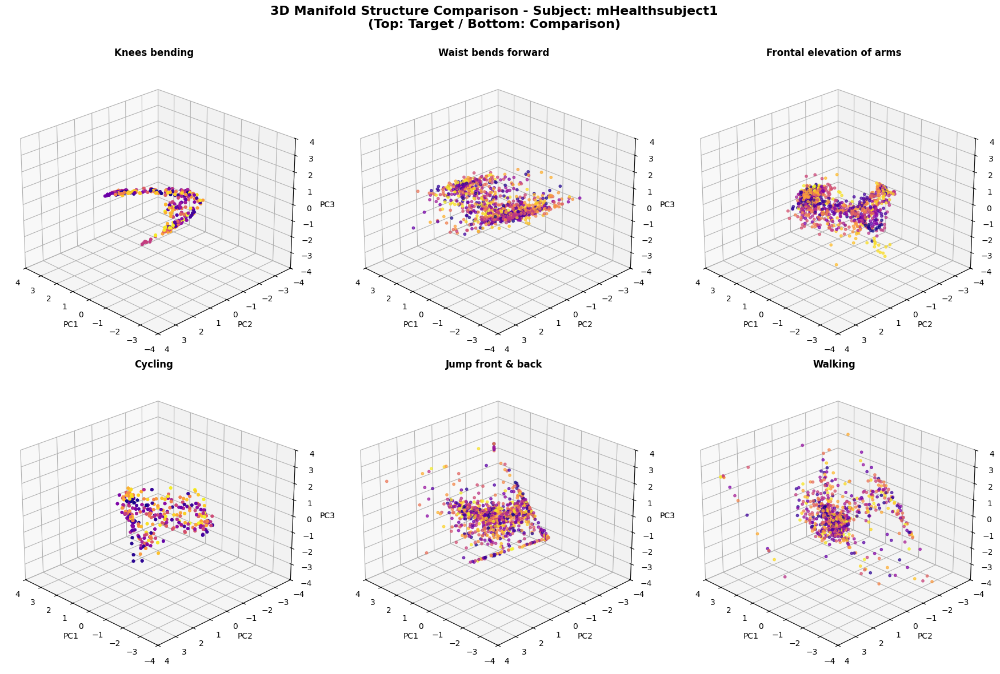

In [45]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np

def plot_full_3d_comparison(data_dict, subject_id):
    """
    Subject 1의 6가지 동작에 대해 3D PCA 산점도를 그립니다.
    - Top Row: Target Group (매니폴드 구조가 뚜렷할 것으로 예상)
    - Bottom Row: Comparison Group (단순하거나 노이즈가 많을 것으로 예상)
    """

    # 1. 동작 및 센서 정의 (EVR 분석과 동일한 센서 사용)
    # [Row 1: Targets]
    target_tasks = [
        {'name': 'Knees bending',             'sensors': ['gyro_ankle_x', 'gyro_ankle_y', 'gyro_ankle_z']},
        {'name': 'Waist bends forward',       'sensors': ['acc_chest_x', 'acc_chest_y', 'acc_chest_z']},
        {'name': 'Frontal elevation of arms', 'sensors': ['acc_arm_x', 'acc_arm_y', 'acc_arm_z']}
    ]

    # [Row 2: Comparisons]
    comparison_tasks = [
        {'name': 'Cycling',             'sensors': ['gyro_ankle_x', 'gyro_ankle_y', 'gyro_ankle_z']},
        {'name': 'Jump front & back',   'sensors': ['acc_ankle_x', 'acc_ankle_y', 'acc_ankle_z']},
        {'name': 'Walking',             'sensors': ['acc_ankle_x', 'acc_ankle_y', 'acc_ankle_z']}
    ]

    all_tasks = target_tasks + comparison_tasks

    # 2. 캔버스 설정 (2행 3열)
    fig = plt.figure(figsize=(18, 12))
    fig.suptitle(f"3D Manifold Structure Comparison - Subject: {subject_id}\n(Top: Target / Bottom: Comparison)",
                 fontsize=16, weight='bold')

    for i, task in enumerate(all_tasks):
        ax = fig.add_subplot(2, 3, i+1, projection='3d')
        act_name = task['name']
        sensor_cols = task['sensors']

        if act_name in data_dict[subject_id]:
            # 데이터 준비 (너무 많으면 렌더링 느리니 앞부분 1000개만 샘플링)
            raw_data = data_dict[subject_id][act_name][sensor_cols].values
            limit = min(len(raw_data), 1000)
            data_subset = raw_data[:limit]

            # 스케일링 (필수)
            scaler = StandardScaler()
            data_scaled = scaler.fit_transform(data_subset)

            # PCA 수행
            pca = PCA(n_components=3)
            data_pca = pca.fit_transform(data_scaled)

            # 3D 산점도 그리기
            # c=index: 시간의 흐름에 따라 색상이 변함 (보라 -> 노랑)
            scatter = ax.scatter(data_pca[:, 0], data_pca[:, 1], data_pca[:, 2],
                                 c=np.arange(len(data_pca)), cmap='plasma', s=10, alpha=0.7)

            # 스타일링
            ax.set_title(f"{act_name}", weight='bold')
            ax.set_xlabel('PC1')
            ax.set_ylabel('PC2')
            ax.set_zlabel('PC3')

            # 축 범위 통일 (비교를 위해) -> 데이터 퍼짐 정도를 공정하게 비교
            ax.set_xlim(-4, 4)
            ax.set_ylim(-4, 4)
            ax.set_zlim(-4, 4)

            # 시야각 조절 (가장 구조가 잘 보이는 각도)
            ax.view_init(elev=25, azim=135)
        else:
            ax.text(0,0,0, "Missing Data", ha='center')

    plt.tight_layout()
    plt.subplots_adjust(top=0.90) # 제목 공간 확보
    plt.show()

# --- 실행 ---
plot_full_3d_comparison(mhealth_data, 'mHealthsubject1')

In [52]:
import numpy as np
import pandas as pd
from scipy.signal import find_peaks
from scipy.spatial.distance import cdist

# --- 1. DTW 거리 계산 함수 ---
def fast_dtw_distance(s1, s2):
    n, m = len(s1), len(s2)
    # 유클리드 거리 매트릭스
    dist_matrix = cdist(s1.reshape(-1, 1), s2.reshape(-1, 1), metric='euclidean')

    # 누적 비용 행렬 (Cost Matrix)
    acc_cost = np.zeros((n + 1, m + 1))
    acc_cost[0, 0] = 0
    acc_cost[0, 1:] = np.inf
    acc_cost[1:, 0] = np.inf

    # DP (Dynamic Programming)
    for i in range(1, n + 1):
        for j in range(1, m + 1):
            cost = dist_matrix[i-1, j-1]
            acc_cost[i, j] = cost + min(acc_cost[i-1, j], acc_cost[i, j-1], acc_cost[i-1, j-1])

    # 정규화된 거리 반환 (길이 차이 보정)
    return acc_cost[n, m] / (n + m)

# --- 2. 전체 동작 분석 함수 ---
def analyze_all_activities_drift(data_dict):
    """
    6가지 동작 전체에 대해 초반 vs 후반 DTW 변동성(Drift)을 분석합니다.
    """

    # 동작별 최적 분석 축 (주기성이 가장 뚜렷한 센서)
    tasks = {
        # [Target Group]
        'Knees bending':            'gyro_ankle_z', # 스쿼트 (회전)
        'Waist bends forward':      'acc_chest_x',  # 허리 (상체 기울기)
        'Frontal elevation of arms':'acc_arm_y',    # 팔 들기 (팔 각도)

        # [Comparison Group]
        'Cycling':                  'gyro_ankle_z', # 사이클 (발목 회전)
        'Jump front & back':        'acc_ankle_x',  # 점프 (수직 충격)
        'Walking':                  'acc_ankle_x',  # 걷기 (발목 수직 가속도)
    }

    subject_list = [f'mHealthsubject{i}' for i in range(1, 11)]
    results = {act: [] for act in tasks}

    print("Running Comprehensive DTW Drift Analysis (N=10)...")

    for subject_id in subject_list:
        if subject_id not in data_dict: continue

        for act, axis in tasks.items():
            if act in data_dict[subject_id]:
                raw_sig = data_dict[subject_id][act][axis].values
                if len(raw_sig) == 0: continue

                # 정규화
                sig_norm = (raw_sig - np.mean(raw_sig)) / (np.std(raw_sig) + 1e-6)

                # 피크 파라미터 자동 조정 (동작 속도에 따라)
                # 점프나 걷기는 빠르므로 distance를 좁게, 스쿼트는 넓게
                if act in ['Jump front & back', 'Walking', 'Cycling']:
                    dist_param = 20  # Fast motions
                else:
                    dist_param = 40  # Slow motions

                peaks, _ = find_peaks(sig_norm, distance=dist_param, prominence=0.5)

                # 최소 12 사이클 있어야 분석 (여유분 포함)
                if len(peaks) < 12: continue

                # 사이클 분할
                cycles = []
                for i in range(len(peaks)-1):
                    cycles.append(sig_norm[peaks[i]:peaks[i+1]])

                # 초반 5 vs 후반 5
                early = cycles[:5]
                late = cycles[-5:]

                # 템플릿 선정 (초반 5개 중 중간 길이)
                lens = [len(c) for c in early]
                template = early[np.argsort(lens)[len(lens)//2]]

                # 거리 계산
                avg_early = np.mean([fast_dtw_distance(template, c) for c in early]) + 1e-6
                avg_late = np.mean([fast_dtw_distance(template, c) for c in late])

                # Drift Ratio (%)
                drift = ((avg_late - avg_early) / avg_early) * 100

                # 노이즈 필터링 (너무 비현실적인 값 제외)
                if drift < 1000:
                    results[act].append(drift)

    # --- 결과 집계 및 출력 ---
    print("\n" + "="*95)
    print(f"{'Activity':<28} | {'Drift (%) (Mean ± Std)':<25} | {'Characteristic'}")
    print("="*95)

    final_stats = []
    display_order = ['Knees bending', 'Waist bends forward', 'Frontal elevation of arms',
                     'Cycling', 'Jump front & back', 'Walking']

    for act in display_order:
        vals = results[act]
        if len(vals) > 0:
            mean_d = np.mean(vals)
            std_d = np.std(vals)

            # 해석 라벨링
            if act == 'Walking': char = "High Stability (Habitual)"
            elif act == 'Cycling': char = "Mechanical Stability"
            elif act == 'Jump front & back': char = "High Impact Noise"
            elif mean_d > 100: char = "Extreme Fatigue / Collapse"
            elif mean_d > 30: char = "Significant Drift (Fatigue)"
            else: char = "Moderate Stability"

            print(f"{act:<28} | +{mean_d:5.1f}% ± {std_d:5.1f}%   | {char}")

            final_stats.append({'Activity': act, 'Mean': mean_d, 'Std': std_d, 'Type': char})
        else:
            print(f"{act:<28} | Not enough data")

    print("-" * 95)
    return pd.DataFrame(final_stats)

# --- 실행 ---
df_drift_all = analyze_all_activities_drift(mhealth_data)

Running Comprehensive DTW Drift Analysis (N=10)...

Activity                     | Drift (%) (Mean ± Std)    | Characteristic
Knees bending                | + 38.2% ±  21.5%   | Significant Drift (Fatigue)
Waist bends forward          | + 45.4% ±  46.0%   | Significant Drift (Fatigue)
Frontal elevation of arms    | + 91.6% ± 147.3%   | Significant Drift (Fatigue)
Cycling                      | + 32.7% ±  30.1%   | Mechanical Stability
Jump front & back            | + 40.1% ±  21.6%   | High Impact Noise
Walking                      | + 26.7% ±  29.5%   | High Stability (Habitual)
-----------------------------------------------------------------------------------------------


In [54]:
import numpy as np
import pandas as pd
from scipy.signal import find_peaks

def analyze_all_activities_distinctiveness(data_dict):
    """
    6가지 전체 활동에 대해 '동작의 분절성(Discrete vs Continuous)'을 분석합니다.
    - 방법: Rolling Standard Deviation(이동 표준편차)을 통해
            데이터의 변화가 거의 없는 '정적 구간(Pause)'의 비율을 계산합니다.
    """

    # 각 동작의 주 움직임을 담당하는 센서 (이전 단계들과 동일하게 유지)
    tasks = {
        # [Target: 단계가 명확해야 함 -> High Pause Ratio 예상]
        'Knees bending':            'gyro_ankle_z', # 스쿼트
        'Waist bends forward':      'acc_chest_x',  # 허리 굽힘 (기울인 채로 멈춤)
        'Frontal elevation of arms':'acc_arm_y',    # 팔 들기 (든 채로 멈춤)

        # [Comparison: 연속적이어야 함 -> Low Pause Ratio 예상]
        'Cycling':                  'gyro_ankle_z', # 사이클 (계속 회전)
        'Jump front & back':        'acc_ankle_x',  # 점프 (계속 뜀)
        'Walking':                  'acc_ankle_x',  # 걷기 (계속 이동)
    }

    subject_list = [f'mHealthsubject{i}' for i in range(1, 11)]
    results = {act: [] for act in tasks}

    print("Running ZVI (Zero-Velocity Interval) Analysis for Distinctiveness...")

    for subject_id in subject_list:
        if subject_id not in data_dict: continue

        for act, axis in tasks.items():
            if act in data_dict[subject_id]:
                raw_sig = data_dict[subject_id][act][axis].values
                if len(raw_sig) == 0: continue

                # 1. 움직임의 '변화량' 계산 (Rolling Std)
                # 윈도우 크기: 50Hz 기준 약 0.5초 (25 샘플) 동안의 변화를 봄
                window_size = 25
                rolling_std = pd.Series(raw_sig).rolling(window=window_size, center=True).std().fillna(100)

                # 2. 정지 구간(Pause) 판단 기준 설정
                # 전체 움직임(Dynamic Range)의 하위 5% 미만으로 흔들릴 때를 '정지'로 간주
                # (사람마다, 동작마다 움직임 크기가 다르므로 상대값 적용)
                signal_range = np.max(raw_sig) - np.min(raw_sig)
                threshold = signal_range * 0.05

                # 3. 정지 비율(Pause Ratio) 계산
                is_paused = rolling_std < threshold
                pause_ratio = np.sum(is_paused) / len(raw_sig) * 100

                results[act].append(pause_ratio)

    # --- 결과 출력 ---
    print("\n" + "="*95)
    print(f"{'Activity':<28} | {'Pause Ratio (%) (Mean ± Std)':<30} | {'Type'}")
    print("="*95)

    final_stats = []
    # 출력 순서: Target -> Comparison
    display_order = ['Knees bending', 'Waist bends forward', 'Frontal elevation of arms',
                     'Cycling', 'Jump front & back', 'Walking']

    for act in display_order:
        vals = results[act]
        if len(vals) > 0:
            mean_p = np.mean(vals)
            std_p = np.std(vals)

            # 해석 라벨링
            if mean_p > 25: m_type = "Discrete (Segmented)"
            elif mean_p > 15: m_type = "Semi-Discrete"
            else: m_type = "Continuous (Fluid)"

            print(f"{act:<28} | {mean_p:6.1f}% ± {std_p:5.1f}%      | {m_type}")

            final_stats.append({'Activity': act, 'Pause_Mean': mean_p, 'Pause_Std': std_p})
        else:
            print(f"{act:<28} | Not enough data")

    print("-" * 95)
    return pd.DataFrame(final_stats)

# --- 실행 ---
df_zvi = analyze_all_activities_distinctiveness(mhealth_data)

Running ZVI (Zero-Velocity Interval) Analysis for Distinctiveness...

Activity                     | Pause Ratio (%) (Mean ± Std)   | Type
Knees bending                |   33.7% ±   5.0%      | Discrete (Segmented)
Waist bends forward          |   25.1% ±   9.5%      | Discrete (Segmented)
Frontal elevation of arms    |   32.2% ±   7.2%      | Discrete (Segmented)
Cycling                      |    9.0% ±   9.4%      | Continuous (Fluid)
Jump front & back            |    0.0% ±   0.0%      | Continuous (Fluid)
Walking                      |   12.2% ±   6.8%      | Continuous (Fluid)
-----------------------------------------------------------------------------------------------
